In [3]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from dataclasses import dataclass
from typing import List, Tuple, Optional, Iterable
import numpy as np
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import warnings
from sklearn.metrics import mean_absolute_error, r2_score
try:
    from sklearn.metrics import root_mean_squared_error
    _HAS_RMSE = True
except Exception: # older scikit-learn
    from sklearn.metrics import mean_squared_error
    _HAS_RMSE = False

# Optional for RC baseline
try:
    import statsmodels.api as sm
except Exception:
    sm = None
from helpers import make_splits_by_is_test_or_date
import joblib
import json 
from features import FEATURES_TIN_OFF
from math import isfinite
import json, os, numpy as np
from features import get_tin_off_features

WIN = 48
# -------------------------
# 1) Utilities
    # If no SW, nothing to calibrate
# -------------------------

# -------------------------
# 2) Masked sequence dataset
# -------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def calibrate_alpha_sw_off(
    df: pd.DataFrame,
    hvac_col: str,
    val_idx: np.ndarray,
    min_sw=50.0,              # only when SW is meaningful
    ridge=1e-6,               # tiny regularization
    improve_eps=1e-4,     
    save_dir_tpl: str = "models/df_{idx}",
    df_index: int = 0,
    device: str = "cuda" if torch.cuda.is_available() else "cpu",
    midday_hours: tuple[int,int] = (10, 16),   # inclusive
    alpha_clip: tuple[float,float] = (-0.02, 0.05)  # °C per (W/m²) per step
) -> float:
    
    assert "Tin_hat_tcn" in df.columns, "Tin_hat_tcn not found. Run assign_tcn_predictions_to_df() first."

    _missing = [c for c in FEATURES_TIN_OFF if c not in df.columns]
    assert not _missing, f"Missing features in df: {_missing}"
    if val_idx is None:
        raise ValueError("val_idx required for α calibration.")

    g = df.iloc[val_idx].copy()
    h0, h1 = midday_hours
    m = (
        (g[hvac_col] == 0) &
        (g.index.hour >= h0) & (g.index.hour <= h1) &
        g["SW_down"].notna() & g["Tin_hat_tcn"].notna() & g["Tin"].notna()
    )
    g = g.loc[m, ["Tin", "Tin_hat_tcn", "SW_down"]]
    if len(g) < 100:  # not enough samples to be robust
        alpha = 0.0
    else:
        y = (g["Tin"] - g["Tin_hat_tcn"]).values.astype(float)    # residuals
        X = g["SW_down"].values.astype(float).reshape(-1, 1)

        # baseline RMSE
        rmse0 = float(np.sqrt(np.mean((y - 0.0)**2)))

        # ridge OLS for alpha
        XT_X = X.T @ X
        XT_y = X.T @ y
        alpha_raw = float(np.linalg.solve(XT_X + ridge * np.eye(1), XT_y))

        # clip to a plausible physical range to avoid overshoot
        alpha_clipped = float(np.clip(alpha_raw, 0.0, 0.0015))  # ~0–0.9 K at 600 W/m²

        # evaluate improvement on val
        y_hat = y - alpha_clipped * X[:, 0]
        rmse1 = float(np.sqrt(np.mean(y_hat**2)))

        # keep α only if it helps
        alpha = alpha_clipped if (rmse1 + improve_eps) < rmse0 else 0.0

    # save
    out = {
        "alpha_sw_off": float(alpha),
        "hours": list(midday_hours),
        "min_sw": float(min_sw),
    }
    save_path = os.path.join(save_dir_tpl.format(idx=df_index), "calibration.json")
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    with open(save_path, "w") as f:
        json.dump(out, f, indent=2)
    print(f"[α] df_{df_index}: alpha_sw_off={alpha:.6g} (saved → {save_path})")
    return alpha

@dataclass
class MaskedSeqDataset(Dataset):
    X: np.ndarray  # (N, window, D)
    y: np.ndarray  # (N,)
    mask: np.ndarray  # (N,) float in {0,1}

    def __len__(self):
        return len(self.y)

    def __getitem__(self, i):
        return (
            torch.tensor(self.X[i], dtype=torch.float32),
            torch.tensor(self.y[i], dtype=torch.float32),
            torch.tensor(self.mask[i], dtype=torch.float32),
        )


def build_masked_seq_dataset(df: pd.DataFrame,
                             input_cols: List[str],
                             window: int = WIN,
                             indices: Optional[Iterable[int]] = None,
                             hvac_col: str = 'hvac_mode',
                             target_col: str = 'Tin_target',
                             ) -> MaskedSeqDataset:

    if indices is None:
        indices = np.arange(len(df))
    sub = df.iloc[indices].copy()

    X_all = sub[input_cols].values
    y_all = sub[target_col].values
    hvac  = sub[hvac_col].values.astype(int)

    N = len(sub)
    seqs, ys, msks = [], [], []
    for i in range(window - 1, N - 1):  # predict y[i] from history
        x_seq = X_all[i - window + 1:i + 1]
        y = y_all[i]
        if not np.isfinite(y):
            continue
        m = 1.0 if (hvac[i] == 0) else 0.0
        seqs.append(x_seq)
        ys.append(y)
        msks.append(m)

    X = np.asarray(seqs, dtype=np.float32)
    y = np.asarray(ys, dtype=np.float32)
    mask = np.asarray(msks, dtype=np.float32)
    return MaskedSeqDataset(X, y, mask)


# -------------------------
# 4) Training with masked loss
# -------------------------


FROZEN_SUFFIXES = ("_sin", "_cos")
BINARY_COLS = {"is_trans_off", "off_runtime_1h"}

def _indices_to_freeze(input_cols):
    return [
        j for j, c in enumerate(input_cols)
        if c.endswith(FROZEN_SUFFIXES) or c in BINARY_COLS
    ]

def _transform_with_freeze(X_np, scaler):
    if not hasattr(scaler, "frozen_idx") or scaler.frozen_idx is None or len(scaler.frozen_idx) == 0:
        return scaler.transform(X_np)

    D = X_np.shape[1]
    frozen = set(scaler.frozen_idx)
    non_frozen = [j for j in range(D) if j not in frozen]

    X_out = X_np.copy()
    if non_frozen:
        X_out[:, non_frozen] = scaler.transform(X_np[:, non_frozen])
    return X_out

def _apply_scaler_to_dataset_with_freeze(ds: MaskedSeqDataset, scaler: StandardScaler) -> MaskedSeqDataset:
    X = ds.X
    N, T, D = X.shape
    X2 = X.reshape(N*T, D)
    X2s = _transform_with_freeze(X2, scaler).reshape(N, T, D)
    return MaskedSeqDataset(X2s.astype(np.float32), ds.y, ds.mask)

def scaled_loader(dloader: DataLoader, scaler, shuffle: bool) -> DataLoader:
        Xs, ys, ms = [], [], []
        for Xb, yb, mb in dloader:
            N, T, D = Xb.shape
            X2 = Xb.numpy().reshape(N*T, D)
            X2s = _transform_with_freeze(X2, scaler).reshape(N, T, D)
            Xs.append(torch.from_numpy(X2s).float())
            ys.append(yb)
            ms.append(mb)
        Xs = torch.cat(Xs, dim=0)
        ys = torch.cat(ys, dim=0)
        ms = torch.cat(ms, dim=0)
        ds = MaskedSeqDataset(Xs.numpy(), ys.numpy(), ms.numpy())
        return DataLoader(ds, batch_size=dloader.batch_size, shuffle=shuffle)

def train_masked_model(model: nn.Module,
                       train_dl: DataLoader,
                       input_cols: list,
                       val_dl: Optional[DataLoader] = None,
                       max_epochs: int = 40,
                       lr: float = 1e-3,
                       device: str = "cuda",
                       verbose: int = 1,
                       save_dir: Optional[str] = None,
                       df_index: Optional[int] = None):
    # ---- fit scaler from raw (unscaled) features in the train loader ----
    frozen_idx = []
    if input_cols is not None:
        frozen_idx = _indices_to_freeze(input_cols)

    X_all = []
    for Xb, _, _ in train_dl:
        X_all.append(Xb.numpy())
    X_all = np.concatenate(X_all, axis=0)
    Ntot, T, D = X_all.shape
    scaler = StandardScaler()
    if frozen_idx:
        non_frozen = [j for j in range(D) if j not in set(frozen_idx)]
        if non_frozen:
            X_flat = X_all.reshape(Ntot*T, D)
            scaler.fit(X_flat[:, non_frozen])
        else:
            # degenerate case; nothing to scale
            scaler.fit(np.zeros((1, 1)))
    else:
        scaler.fit(X_all.reshape(Ntot*T, D))

    # stash frozen indices on the scaler for later use
    scaler.frozen_idx = tuple(frozen_idx)

    # 2) rebuild loaders with scaling that preserves frozen columns
    train_dl = scaled_loader(train_dl, scaler, shuffle=True)
    if val_dl is not None:
        val_dl = scaled_loader(val_dl, scaler, shuffle=False)

    opt = torch.optim.Adam(model.parameters(), lr=lr,  weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    opt, mode="min", factor=0.5, patience=10, cooldown=0, verbose=False
)
    best_val = float("inf")
    best_state = None
    patience = 40          # early-stopping patience
    epochs_since_improve = 0

    for epoch in range(1, max_epochs + 1):
        model.train()
        tr_sum_sq, tr_count = 0.0, 0

        for Xb, yb, mb in train_dl:
            Xb, yb, mb = Xb.to(device), yb.to(device), mb.to(device)
            if mb.sum().item() < 1:
                continue
            pred = model(Xb)
            sq = (pred - yb) ** 2
            # loss = (sq * mb).sum() / mb.sum()
            per_elem = F.smooth_l1_loss(pred, yb, reduction="none", beta=0.5)  # beta=0.5° C switch point
            loss = (per_elem * mb).sum() / (mb.sum().clamp_min(1))
            opt.zero_grad(); loss.backward() 
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)  # grad clipping            
            opt.step()
            tr_sum_sq += (sq * mb).sum().item()
            tr_count += int(mb.sum().item())

        tr_rmse = np.sqrt(tr_sum_sq / max(tr_count, 1)) if tr_count else np.nan

        # ---- validate ----
        val_rmse = np.nan
        if val_dl is not None:
            model.eval(); vsum_sq, vcount = 0.0, 0
            with torch.no_grad():
                for Xb, yb, mb in val_dl:
                    Xb, yb, mb = Xb.to(device), yb.to(device), mb.to(device)
                    if mb.sum().item() < 1:
                        continue
                    pred = model(Xb)
                    sq = (pred - yb) ** 2
                    vsum_sq += (sq * mb).sum().item()
                    vcount  += int(mb.sum().item())
            val_rmse = np.sqrt(vsum_sq / max(vcount, 1)) if vcount else np.nan

            metric = val_rmse if np.isfinite(val_rmse) else float("inf")
            scheduler.step(metric)

            if metric < best_val - 1e-6:
                best_val = metric
                best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
                epochs_since_improve = 0

                # ✅ Save best model checkpoint
                if save_dir is not None and df_index is not None:
                    out_dir = os.path.join(save_dir, f"df_{df_index}")
                    os.makedirs(out_dir, exist_ok=True)
                    path = os.path.join(out_dir, "best_tinv2.pt")
                    torch.save(best_state, path)
                    if verbose:
                        print(f"✅ Saved best model to: {path}")

                    scaler_dir = os.path.join(save_dir, "scalers", f"df_{df_index}")
                    os.makedirs(scaler_dir, exist_ok=True)
                    scaler_path = os.path.join(scaler_dir, "scaler_tin.pkl")
                    joblib.dump({"scaler": scaler, "feature_order": FEATURES_TIN_OFF}, scaler_path)
                    if verbose:
                        print(f"🧪 Saved scaler to: {scaler_path}")
                    with open(os.path.join(out_dir, "tin_off_features.json"), "w") as f:
                        json.dump({"input_cols": list(input_cols)}, f, indent=2)
            else:
                epochs_since_improve += 1
                if epochs_since_improve >= patience:
                    if verbose:
                        print(f"⏹️ Early stopping at epoch {epoch} (no val improvement for {patience} epochs).")
                    break
        if verbose:
            print(f"Epoch {epoch:03d} | train RMSE_off={tr_rmse:.3f}°C"
                  f"{' | val RMSE_off=' + (f'{val_rmse:.3f}°C' if np.isfinite(val_rmse) else 'nan') if val_dl else ''}"
                  f" | masked steps (train)={tr_count}")

    if best_state is not None:
        model.load_state_dict(best_state)
    if verbose:
        print(f"🏁 Training complete. Best val RMSE_off = {best_val:.3f}°C")
    return model, scaler

def _rmse(y_true, y_pred):
    if _HAS_RMSE:
        return root_mean_squared_error(y_true, y_pred)
    else:
        return float(np.sqrt(mean_squared_error(y_true, y_pred)))

def evaluate_masked_model(model: nn.Module,
                          dataset: MaskedSeqDataset,
                          device: str = 'cpu') -> dict:
    model.eval()
    X = torch.from_numpy(dataset.X).float().to(device)
    y = torch.from_numpy(dataset.y).float().to(device)
    m = torch.from_numpy(dataset.mask).float().to(device)
    with torch.no_grad():
        pred = model(X)
    # compute metrics **on masked subset**
    on_mask = m > 0.5
    if on_mask.sum() < 1:
        return {'mae': np.nan, 'rmse': np.nan, 'r2': np.nan, 'count_masked': 0}
    y_m = y[on_mask].cpu().numpy()
    p_m = pred[on_mask].cpu().numpy()
    mae = mean_absolute_error(y_m, p_m)
    rmse = _rmse(y_m, p_m)
    r2 = r2_score(y_m, p_m)
    return {'mae': mae, 'rmse': rmse, 'r2': r2, 'count_masked': int(on_mask.sum().item())}

class CausalBlock(nn.Module):
    def __init__(self, in_ch, out_ch, k=7, dilation=1, dropout=0.15):
        super().__init__()
        pad = (k - 1) * dilation
        self.pad = nn.ConstantPad1d((pad, 0), 0.0)

        self.conv = nn.Conv1d(in_ch, out_ch, kernel_size=k, dilation=dilation, padding=0)
        self.norm = nn.LayerNorm(out_ch)
        self.act  = nn.ReLU()
        self.drop = nn.Dropout(dropout)

        # 1x1 conv for residual if channels mismatch
        self.res_proj = nn.Conv1d(in_ch, out_ch, kernel_size=1) if in_ch != out_ch else None

    def forward(self, x):  # x: (B, C, T)
        res = x if self.res_proj is None else self.res_proj(x)
        y = self.conv(self.pad(x))          # (B, C_out, T)
        # LayerNorm over channel dim → permute to (B,T,C)
        y = y.transpose(1, 2)
        y = self.norm(y)
        y = y.transpose(1, 2)
        y = self.act(y)
        y = self.drop(y)
        return y + res

class ResTCNRegressor(nn.Module):
    def __init__(self, in_dim, hidden=256, levels=6, kernel_size=7, dropout=0.15, out_dim=1):
        super().__init__()
        ch = in_dim
        blocks = []
        for l in range(levels):
            dil = 2 ** l  # 1,2,4,8,16,32
            blocks.append(CausalBlock(ch, hidden, k=kernel_size, dilation=dil, dropout=dropout))
            ch = hidden
        self.net = nn.Sequential(*blocks)
        self.head = nn.Linear(hidden, out_dim)

    def forward(self, x):         # x: (B, T, D)
        x = x.transpose(1, 2)     # (B, D, T)
        y = self.net(x)[:, :, -1] # last causal step
        return self.head(y).squeeze(-1)
    
# -------------------------
# 6) Visualization helper (optional)
# -------------------------
import matplotlib.pyplot as plt
from matplotlib.dates import AutoDateLocator, ConciseDateFormatter


def plot_day_overlay(df: pd.DataFrame,
                     model: nn.Module,
                     scaler: StandardScaler,
                     input_cols: list,
                     window: int,
                     day_center_idx: int,
                     hvac_col: str = "hvac_mode",
                     title_prefix: str = "Tin forecast (OFF-only)",
                     device: Optional[torch.device] = None,
                     pump_col: Optional[str] = "pump_energy",
                    ):  
    """Predict next-step everywhere, then show predictions according to assign_rule."""
    left, right = window, WIN
    start = max(0, day_center_idx - left)
    end   = min(len(df) - 1, day_center_idx + right)
    sub = df.iloc[start:end + 1].copy()

    X_all = sub[input_cols].values.astype(np.float32)
    X2 = _transform_with_freeze(X_all, scaler)

    if device is None:
        device = next(model.parameters()).device

    preds_all = [np.nan] * len(sub)
    model.eval()
    with torch.no_grad():
        for i in range(window - 1, len(sub) - 1):
            if sub[hvac_col].iloc[i] == 0:  # only OFF
                x_seq = torch.tensor(X2[i - window + 1:i + 1][None, ...]).float().to(device)
                preds_all[i + 1] = model(x_seq).detach().cpu().item()

    fig, ax = plt.subplots(figsize=(14, 5))
    ax.plot(sub.index, sub["Tin"], label="Tin (GT)")
    ax.plot(sub.index, preds_all, label="Tin_hat (model)", color="orange")

    off_mask = (sub[hvac_col].values == 0)
    ax.fill_between(sub.index, sub["Tin"].min()-1, sub["Tin"].max()+1,
                    where=off_mask, alpha=0.08, label="HVAC OFF")

    if pump_col and pump_col in sub.columns:
        ax2 = ax.twinx()
        ax2.plot(sub.index, sub[pump_col], linestyle="--", alpha=0.35, label="pump_energy")
        ax2.set_ylabel("pump_energy")
        l1, lb1 = ax.get_legend_handles_labels()
        l2, lb2 = ax2.get_legend_handles_labels()
        ax2.legend(l1+l2, lb1+lb2, loc="upper left", framealpha=0.9)
    else:
        ax.legend(loc="upper left")

    loc = AutoDateLocator(); fmt = ConciseDateFormatter(loc)
    ax.xaxis.set_major_locator(loc); ax.xaxis.set_major_formatter(fmt)
    ax.set_title(f"{title_prefix} — idx {day_center_idx}")
    ax.set_ylabel("Temperature [°C]")
    plt.tight_layout(); plt.show()


def compare_off_predictions(df, col_pred: str, hvac_col):
    mask = (df[hvac_col] == 0) & df[col_pred].notna()
    Tin_gt = df.loc[mask, "Tin"]
    Tin_hat = df.loc[mask, col_pred]
    return {
        "MAE": mean_absolute_error(Tin_gt, Tin_hat),
        "RMSE": _rmse(Tin_gt, Tin_hat),
        "Count": len(Tin_hat),
    }

def assign_tcn_predictions_to_df(df, model, scaler, input_cols,
                                indices, window=WIN,
                                hvac_col="hvac_mode",
                                device="cuda" if torch.cuda.is_available() else "cpu"):

    df = df.copy()
    preds = np.full(len(df), np.nan, dtype=np.float32)
    model.eval()

    X_all = df[input_cols].values.astype(np.float32)

    with torch.no_grad():
        for i in indices:
            if i < window: continue
            if df[hvac_col].iloc[i] != 0: continue
            x_seq = X_all[i - window:i]
            x_seq = _transform_with_freeze(x_seq, scaler)
            x_seq = torch.tensor(x_seq[None, ...]).float().to(device)
            preds[i] = model(x_seq).detach().cpu().item()

    df["Tin_hat_tcn"] = preds
    return df

def run_tcn_tin_for_folder(
    folder_path: str,
    hvac_col: str = "hvac_mode",
    save_root: str = "models"
):

    dfs = []

    for filename in os.listdir(folder_path):
        if filename.endswith('with_comfort.csv'):
            file_path = os.path.join(folder_path, filename)
            df = pd.read_csv(file_path)
        
            df['timestamp'] = pd.to_datetime(df['timestamps'])
            
            df.drop(columns=['timestamps'], inplace=True)
            df.set_index('timestamp', inplace=True)
            df.sort_index(inplace=True)
            dfs.append(df)

    for index, df in enumerate(dfs):
        tin_off_input_cols = get_tin_off_features(df)
        train_idx, val_idx, test_idx = make_splits_by_is_test_or_date(df)
        train_ds = build_masked_seq_dataset(df, tin_off_input_cols, window=WIN, indices=train_idx, hvac_col=hvac_col)
        val_ds   = build_masked_seq_dataset(df, tin_off_input_cols, window=WIN, indices=val_idx, hvac_col=hvac_col)
        test_ds  = build_masked_seq_dataset(df, tin_off_input_cols, window=WIN, indices=test_idx, hvac_col=hvac_col)

        device = "cuda" if torch.cuda.is_available() else "cpu"

        model = ResTCNRegressor(in_dim=len(tin_off_input_cols), hidden=256, levels=6, kernel_size=7, dropout=0.15).to(device)

        model, scaler = train_masked_model(
            model,
            DataLoader(train_ds, batch_size=256, shuffle=True),
            tin_off_input_cols,
            DataLoader(val_ds, batch_size=512, shuffle=False),
            max_epochs=200,
            lr=1e-3,
            device=device,
            save_dir=save_root,
            df_index=index
        )

        test_ds_scaled = _apply_scaler_to_dataset_with_freeze(test_ds, scaler)
        print(evaluate_masked_model(model, test_ds_scaled, device=device))

        min_idx = min(test_idx)
        max_idx = max(test_idx)
        day_stride = 96  # one day at 15-min resolution
        valid_test_centers = [i for i in range(min_idx + 48, max_idx - 48, day_stride)]

        df = assign_tcn_predictions_to_df(df, model, scaler, tin_off_input_cols,
                                        indices=test_idx,
                                        window=WIN,
                                        device="cuda" if torch.cuda.is_available() else "cpu")

        print("Masked LSTM:", compare_off_predictions(df, "Tin_hat_tcn", hvac_col))
        # print("RC baseline:", compare_off_predictions(df, "Tin_hat_rc"))
        alpha_sw = calibrate_alpha_sw_off(
            df=df, hvac_col=hvac_col,
            val_idx=val_idx,       # or your chosen win_tin
            save_dir_tpl="models/df_{idx}",
            df_index=index, device=device,
        )  
        # Now plot any of them safely:
        for center_idx in valid_test_centers[:4]:  # first 3 test days
            plot_day_overlay(df, model, scaler, tin_off_input_cols, window=WIN,
                            day_center_idx=center_idx, hvac_col=hvac_col,
                            pump_col="pump_energy")
        

c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models\df_0\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_0\scaler_tin.pkl
Epoch 001 | train RMSE_off=3.008°C | val RMSE_off=0.162°C | masked steps (train)=13697
Epoch 002 | train RMSE_off=0.493°C | val RMSE_off=0.198°C | masked steps (train)=13697
Epoch 003 | train RMSE_off=0.424°C | val RMSE_off=0.233°C | masked steps (train)=13697
Epoch 004 | train RMSE_off=0.440°C | val RMSE_off=0.285°C | masked steps (train)=13697
Epoch 005 | train RMSE_off=0.378°C | val RMSE_off=0.194°C | masked steps (train)=13697
Epoch 006 | train RMSE_off=0.399°C | val RMSE_off=0.865°C | masked steps (train)=13697
Epoch 007 | train RMSE_off=0.536°C | val RMSE_off=0.246°C | masked steps (train)=13697
Epoch 008 | train RMSE_off=0.405°C | val RMSE_off=0.336°C | masked steps (train)=13697
✅ Saved best model to: models\df_0\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_0\scaler_tin.pkl
Epoch 009 | train RMSE_off=0.395°C | val RMSE_off=0.119°C | masked steps (train)=13697
Epoch 010 |

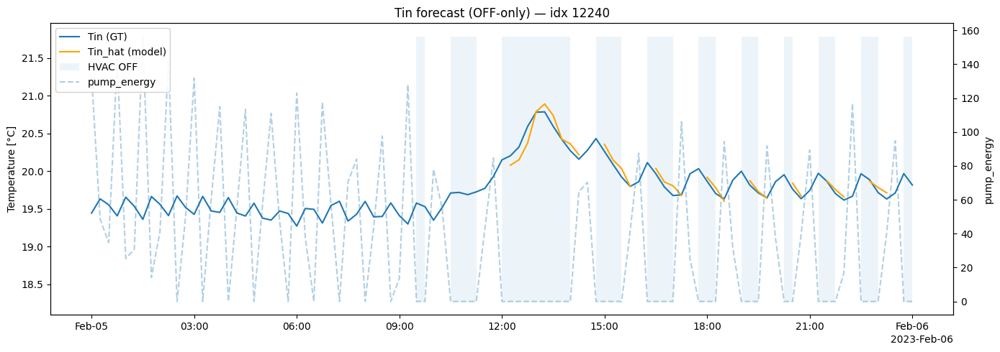

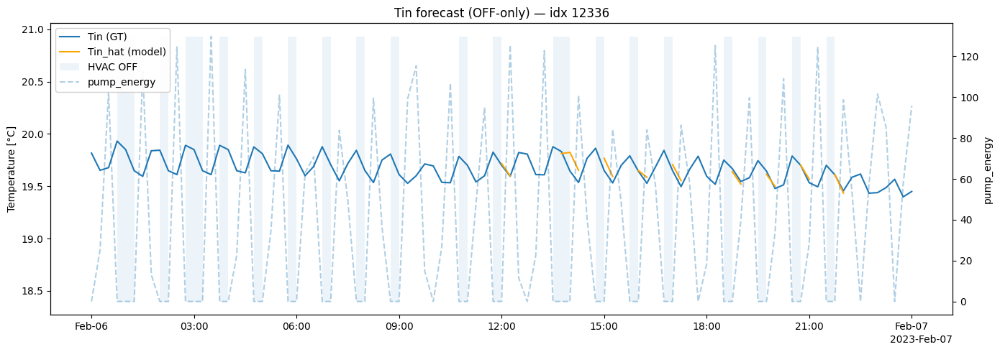

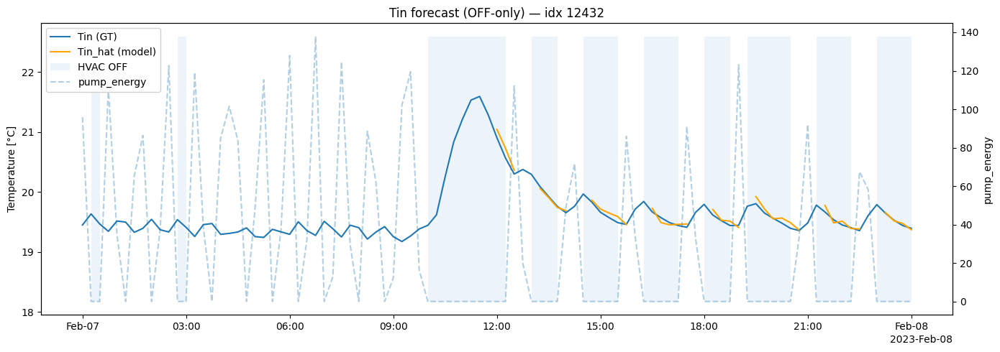

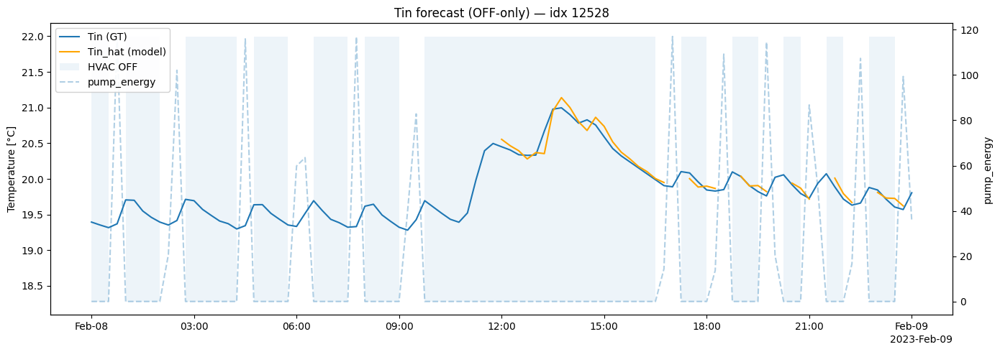

c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models\df_1\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_1\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.575°C | val RMSE_off=0.852°C | masked steps (train)=5968
✅ Saved best model to: models\df_1\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_1\scaler_tin.pkl
Epoch 002 | train RMSE_off=0.546°C | val RMSE_off=0.363°C | masked steps (train)=5968
✅ Saved best model to: models\df_1\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_1\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.524°C | val RMSE_off=0.213°C | masked steps (train)=5968
Epoch 004 | train RMSE_off=0.489°C | val RMSE_off=0.272°C | masked steps (train)=5968
✅ Saved best model to: models\df_1\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_1\scaler_tin.pkl
Epoch 005 | train RMSE_off=0.460°C | val RMSE_off=0.183°C | masked steps (train)=5968
Epoch 006 | train RMSE_off=0.483°C | val RMSE_off=0.609°C | masked steps (train)=5968
✅ Saved best model to: models\df_1\best_tinv2.pt
🧪 Saved scaler to: mode

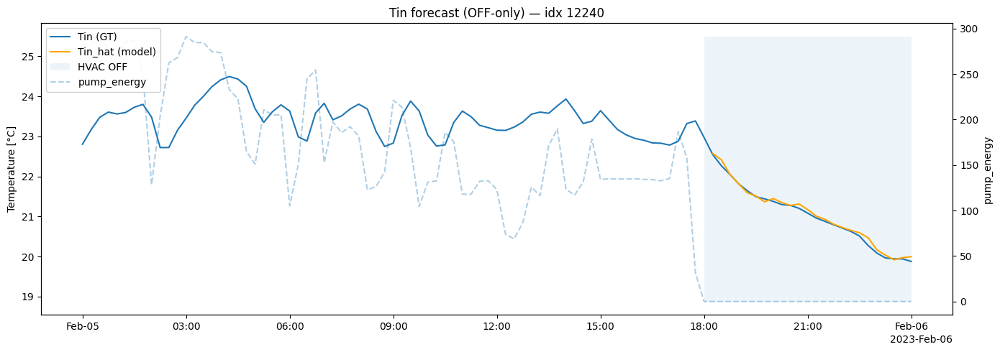

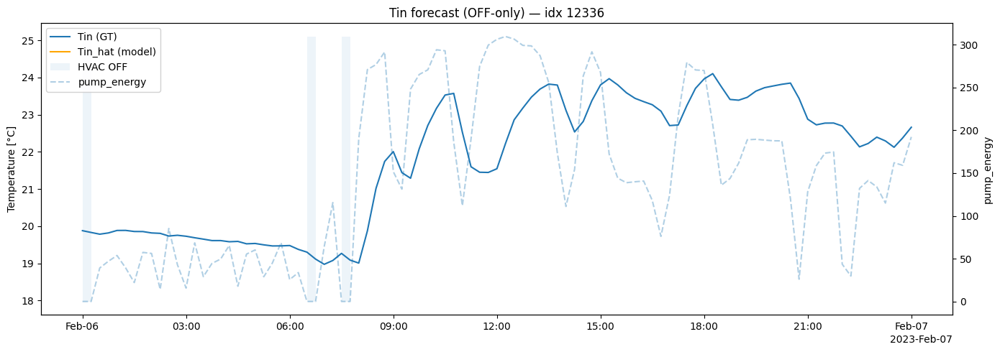

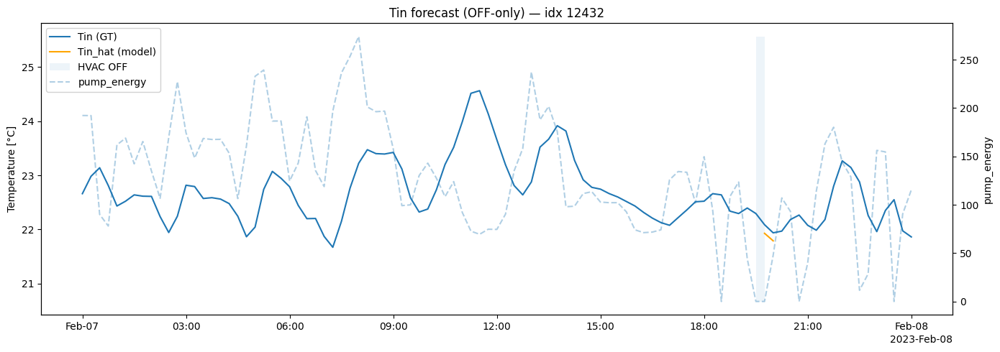

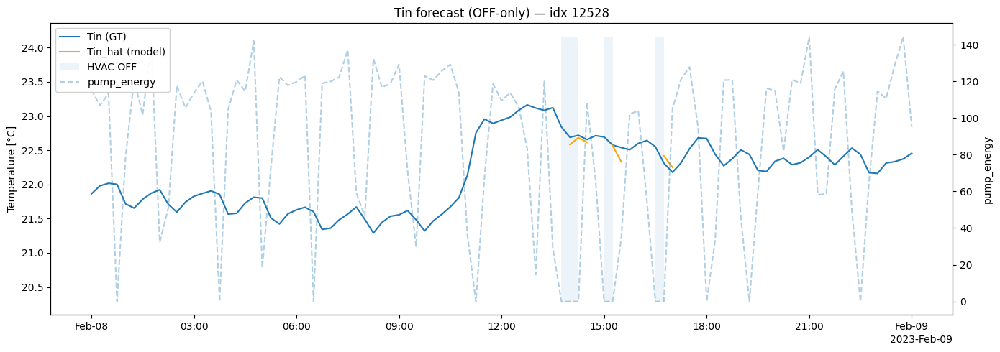

c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models\df_2\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_2\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.612°C | val RMSE_off=0.187°C | masked steps (train)=12567
Epoch 002 | train RMSE_off=0.436°C | val RMSE_off=0.264°C | masked steps (train)=12567
Epoch 003 | train RMSE_off=0.414°C | val RMSE_off=0.276°C | masked steps (train)=12567
Epoch 004 | train RMSE_off=0.407°C | val RMSE_off=0.283°C | masked steps (train)=12567
Epoch 005 | train RMSE_off=0.393°C | val RMSE_off=0.239°C | masked steps (train)=12567
✅ Saved best model to: models\df_2\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_2\scaler_tin.pkl
Epoch 006 | train RMSE_off=0.403°C | val RMSE_off=0.141°C | masked steps (train)=12567
Epoch 007 | train RMSE_off=0.396°C | val RMSE_off=0.161°C | masked steps (train)=12567
Epoch 008 | train RMSE_off=0.355°C | val RMSE_off=0.188°C | masked steps (train)=12567
Epoch 009 | train RMSE_off=0.401°C | val RMSE_off=0.178°C | masked steps (train)=12567
Epoch 010 |

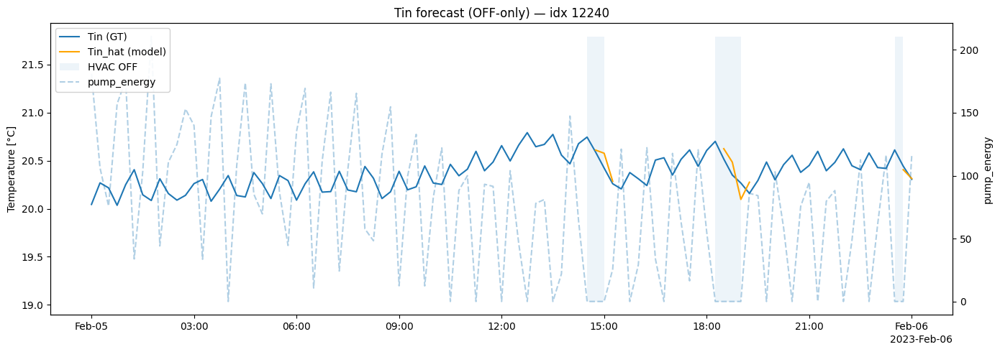

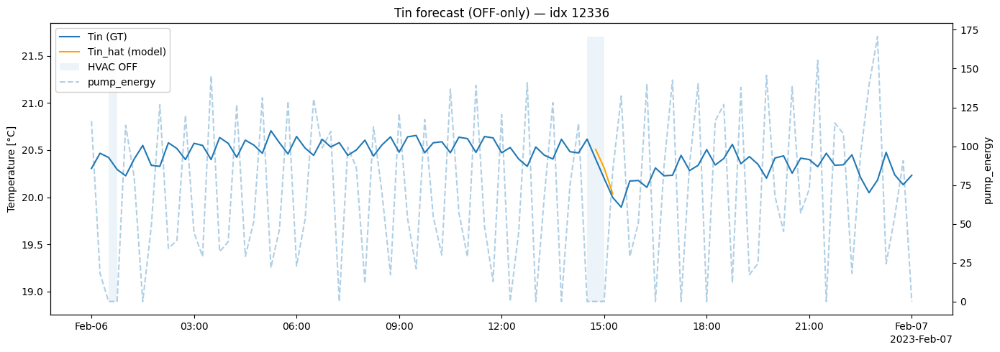

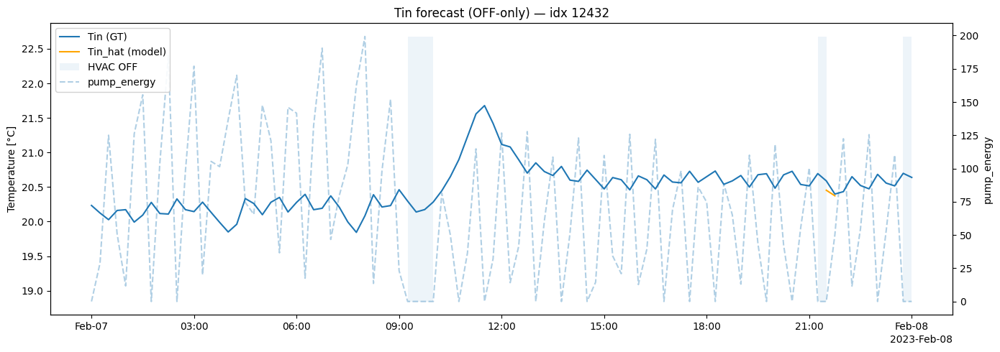

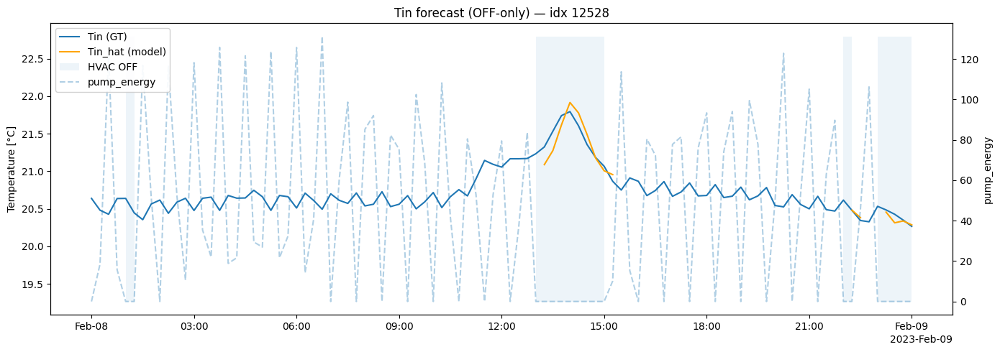

c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models\df_3\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_3\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.793°C | val RMSE_off=0.717°C | masked steps (train)=4336
Epoch 002 | train RMSE_off=0.605°C | val RMSE_off=0.794°C | masked steps (train)=4336
Epoch 003 | train RMSE_off=0.525°C | val RMSE_off=0.958°C | masked steps (train)=4336
Epoch 004 | train RMSE_off=0.541°C | val RMSE_off=1.046°C | masked steps (train)=4336
Epoch 005 | train RMSE_off=0.492°C | val RMSE_off=1.124°C | masked steps (train)=4336
Epoch 006 | train RMSE_off=0.489°C | val RMSE_off=0.804°C | masked steps (train)=4336
Epoch 007 | train RMSE_off=0.506°C | val RMSE_off=0.958°C | masked steps (train)=4336
Epoch 008 | train RMSE_off=0.479°C | val RMSE_off=1.854°C | masked steps (train)=4336
Epoch 009 | train RMSE_off=0.467°C | val RMSE_off=2.012°C | masked steps (train)=4336
Epoch 010 | train RMSE_off=0.449°C | val RMSE_off=0.976°C | masked steps (train)=4336
✅ Saved best model to: models\df_3\be

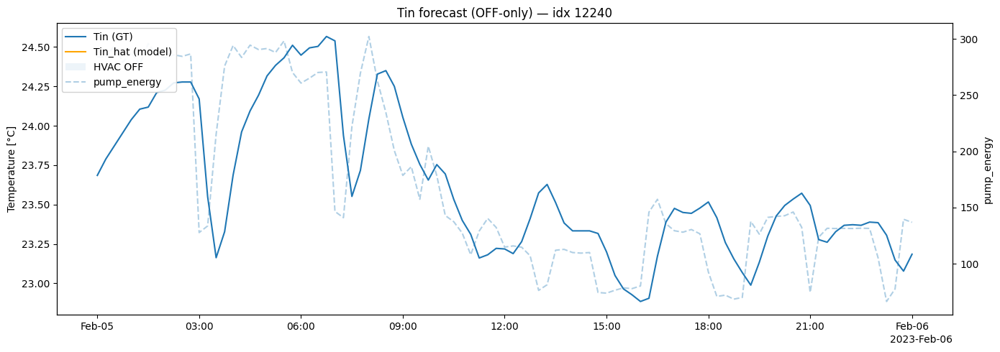

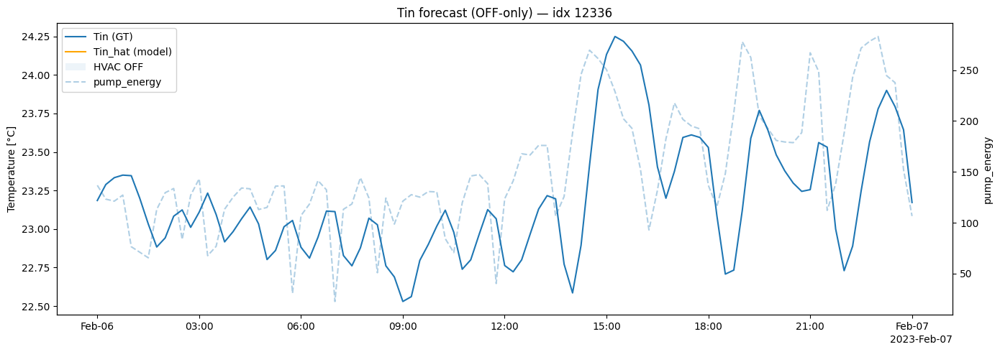

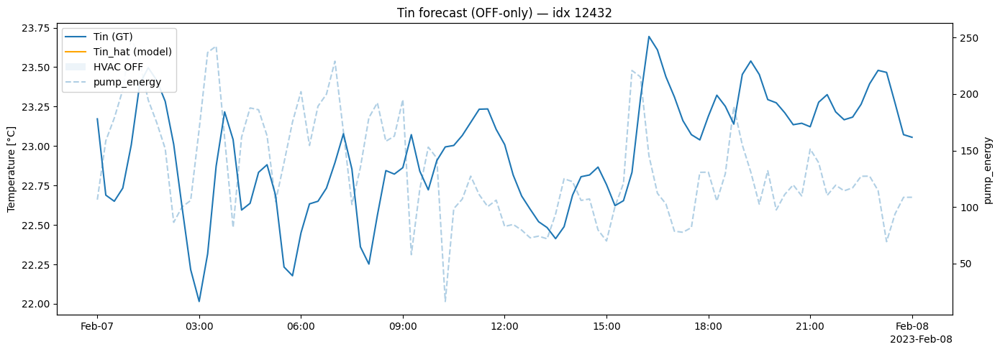

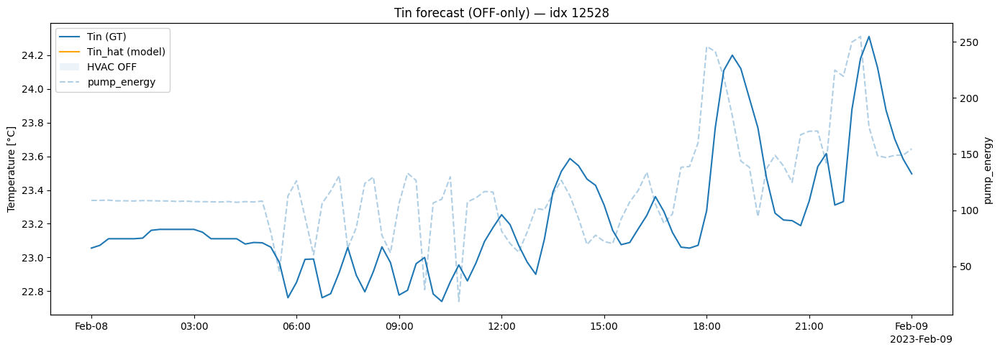

c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models\df_4\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_4\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.683°C | val RMSE_off=0.303°C | masked steps (train)=15600
Epoch 002 | train RMSE_off=0.494°C | val RMSE_off=0.784°C | masked steps (train)=15600
✅ Saved best model to: models\df_4\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_4\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.471°C | val RMSE_off=0.243°C | masked steps (train)=15600
Epoch 004 | train RMSE_off=0.380°C | val RMSE_off=0.356°C | masked steps (train)=15600
Epoch 005 | train RMSE_off=0.493°C | val RMSE_off=0.258°C | masked steps (train)=15600
Epoch 006 | train RMSE_off=0.434°C | val RMSE_off=0.299°C | masked steps (train)=15600
✅ Saved best model to: models\df_4\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_4\scaler_tin.pkl
Epoch 007 | train RMSE_off=0.424°C | val RMSE_off=0.151°C | masked steps (train)=15600
Epoch 008 | train RMSE_off=0.421°C | val RMSE_off=0.251°C | masked steps (train)=1

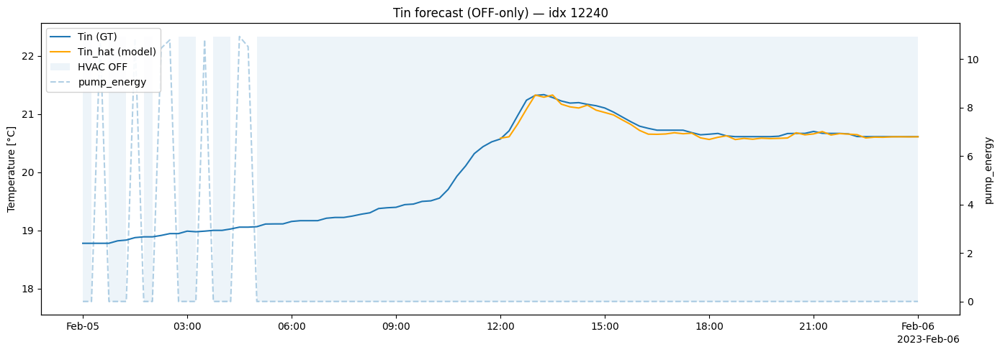

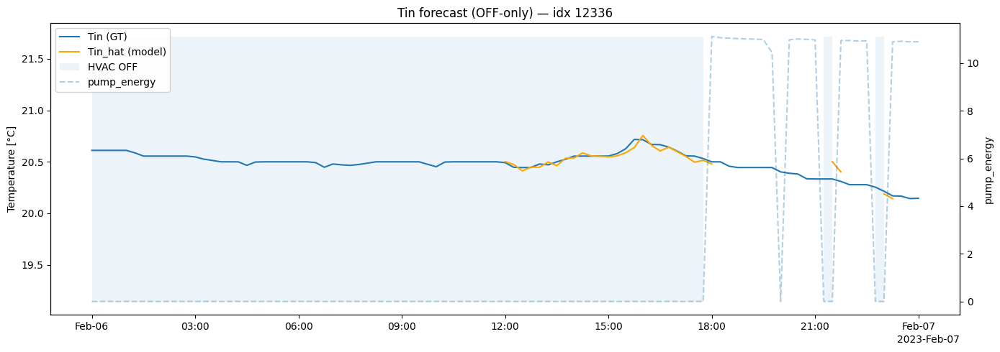

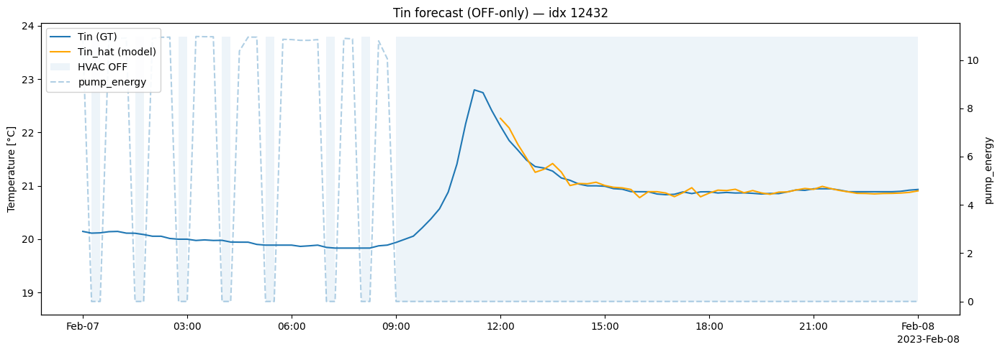

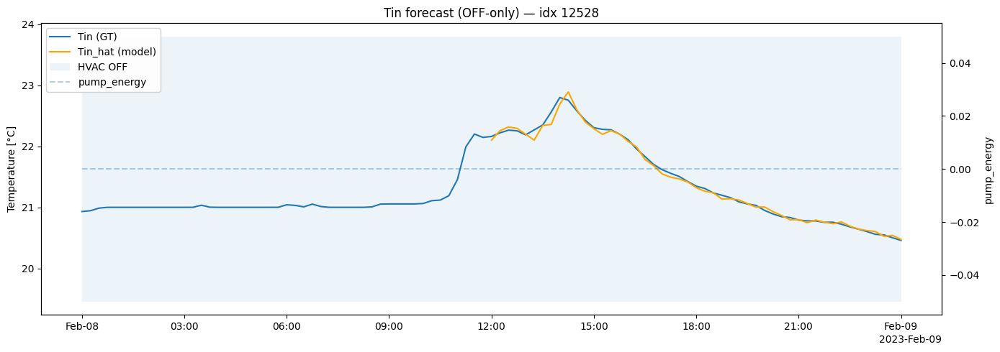

c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models\df_5\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_5\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.700°C | val RMSE_off=0.496°C | masked steps (train)=9280
✅ Saved best model to: models\df_5\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_5\scaler_tin.pkl
Epoch 002 | train RMSE_off=0.457°C | val RMSE_off=0.167°C | masked steps (train)=9280
✅ Saved best model to: models\df_5\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_5\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.478°C | val RMSE_off=0.148°C | masked steps (train)=9280
Epoch 004 | train RMSE_off=0.448°C | val RMSE_off=0.267°C | masked steps (train)=9280
Epoch 005 | train RMSE_off=0.417°C | val RMSE_off=0.150°C | masked steps (train)=9280
✅ Saved best model to: models\df_5\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_5\scaler_tin.pkl
Epoch 006 | train RMSE_off=0.378°C | val RMSE_off=0.138°C | masked steps (train)=9280
Epoch 007 | train RMSE_off=0.368°C | val RMSE_off=0.200°C | masked steps

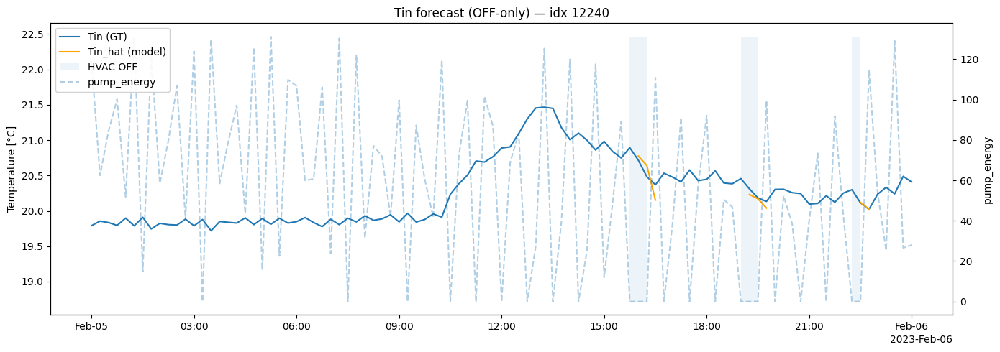

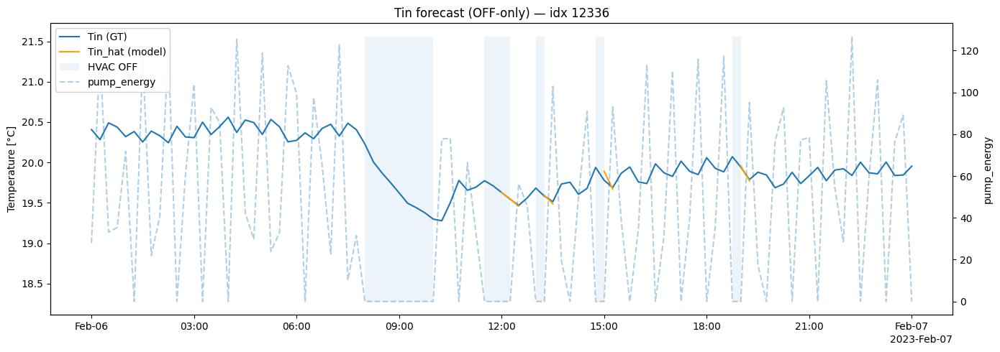

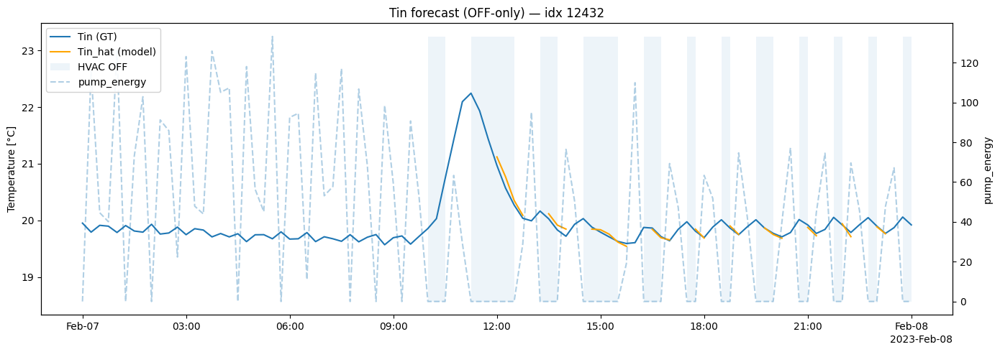

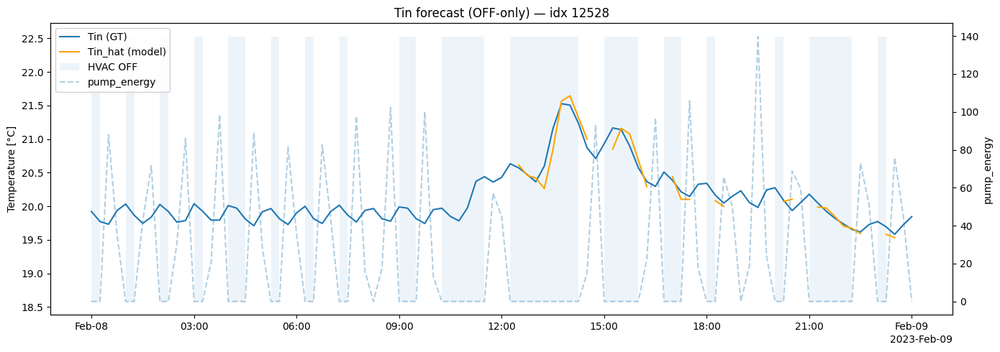

c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models\df_6\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_6\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.067°C | val RMSE_off=0.227°C | masked steps (train)=7842
Epoch 002 | train RMSE_off=0.513°C | val RMSE_off=0.563°C | masked steps (train)=7842
✅ Saved best model to: models\df_6\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_6\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.481°C | val RMSE_off=0.136°C | masked steps (train)=7842
✅ Saved best model to: models\df_6\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_6\scaler_tin.pkl
Epoch 004 | train RMSE_off=0.396°C | val RMSE_off=0.122°C | masked steps (train)=7842
Epoch 005 | train RMSE_off=0.368°C | val RMSE_off=0.122°C | masked steps (train)=7842
Epoch 006 | train RMSE_off=0.359°C | val RMSE_off=0.234°C | masked steps (train)=7842
Epoch 007 | train RMSE_off=0.363°C | val RMSE_off=0.159°C | masked steps (train)=7842
Epoch 008 | train RMSE_off=0.459°C | val RMSE_off=0.215°C | masked steps (train)=7842
Epo

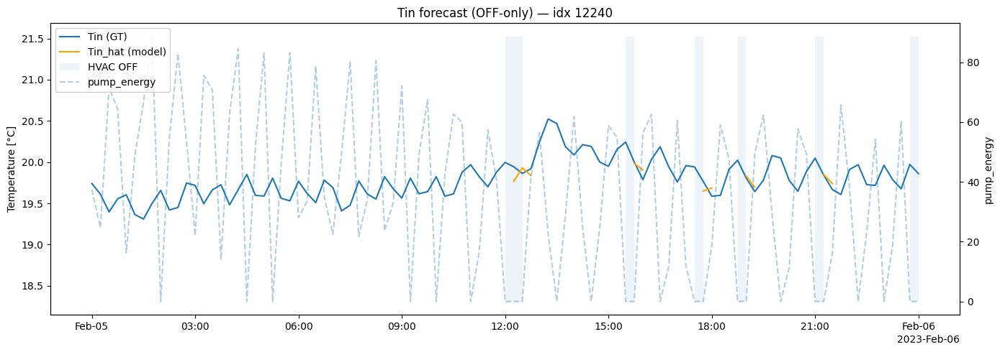

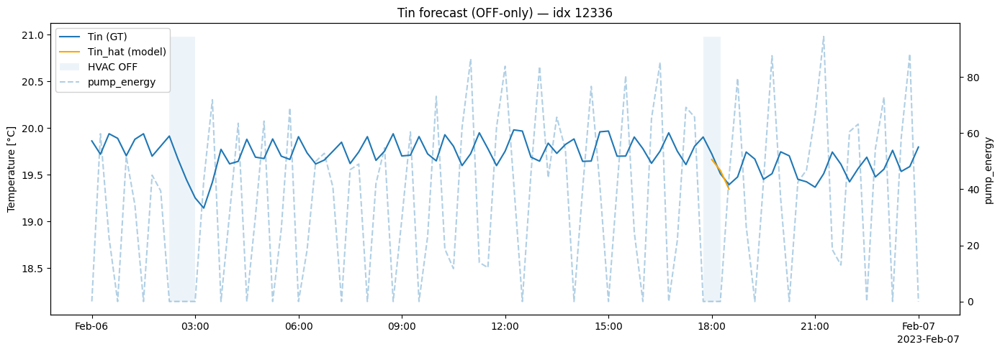

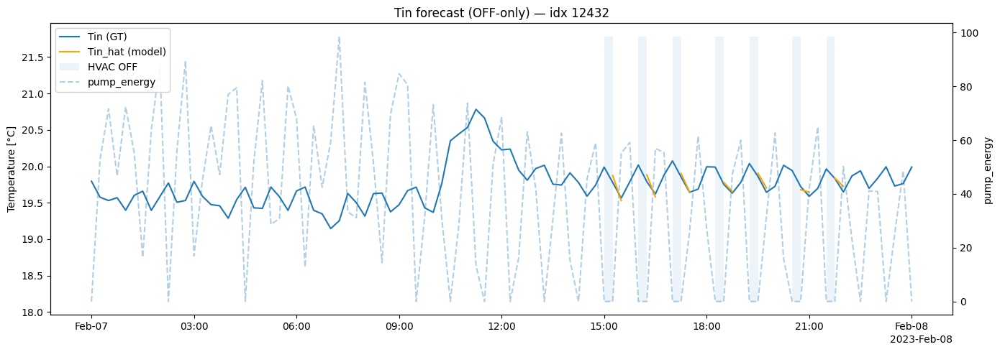

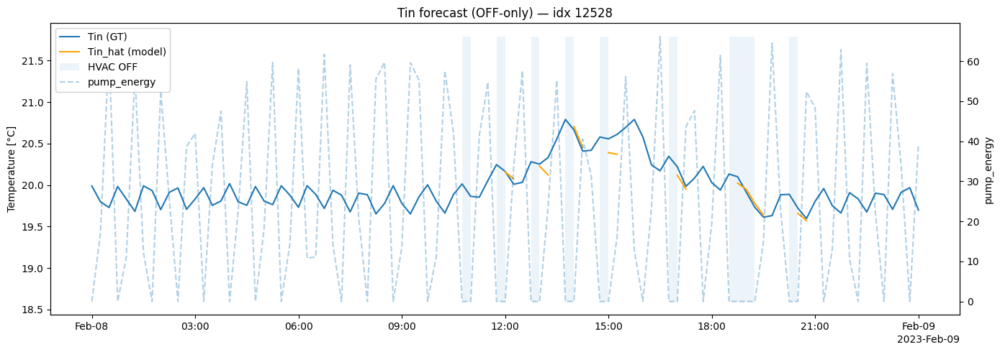

c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models\df_7\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_7\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.410°C | val RMSE_off=0.391°C | masked steps (train)=5821
Epoch 002 | train RMSE_off=0.566°C | val RMSE_off=0.438°C | masked steps (train)=5821
✅ Saved best model to: models\df_7\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_7\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.533°C | val RMSE_off=0.304°C | masked steps (train)=5821
✅ Saved best model to: models\df_7\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_7\scaler_tin.pkl
Epoch 004 | train RMSE_off=0.418°C | val RMSE_off=0.267°C | masked steps (train)=5821
✅ Saved best model to: models\df_7\best_tinv2.pt
🧪 Saved scaler to: models\scalers\df_7\scaler_tin.pkl
Epoch 005 | train RMSE_off=0.459°C | val RMSE_off=0.244°C | masked steps (train)=5821
Epoch 006 | train RMSE_off=0.393°C | val RMSE_off=0.561°C | masked steps (train)=5821
Epoch 007 | train RMSE_off=0.406°C | val RMSE_off=0.259°C | masked steps

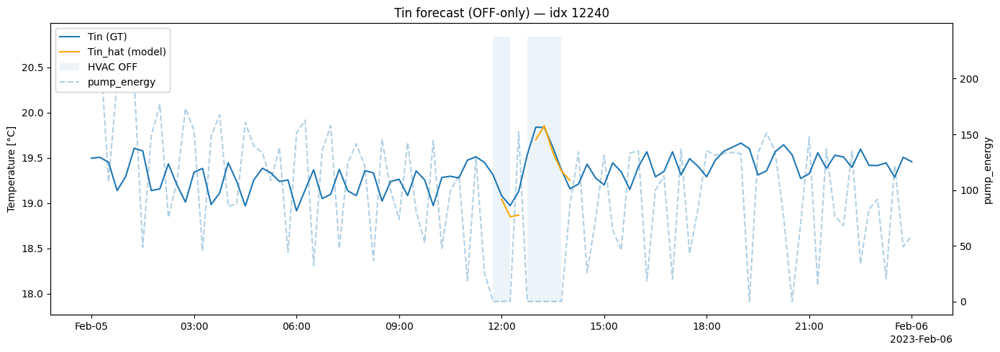

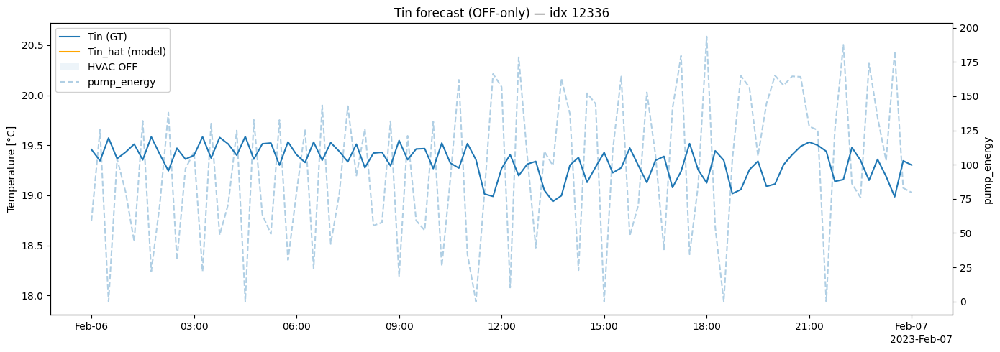

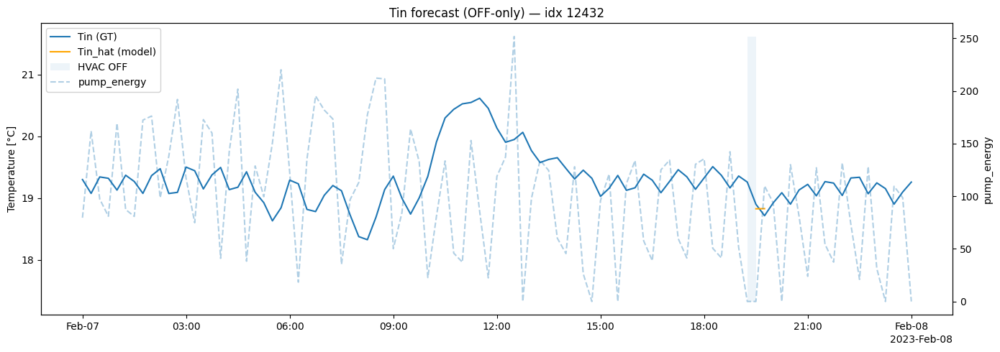

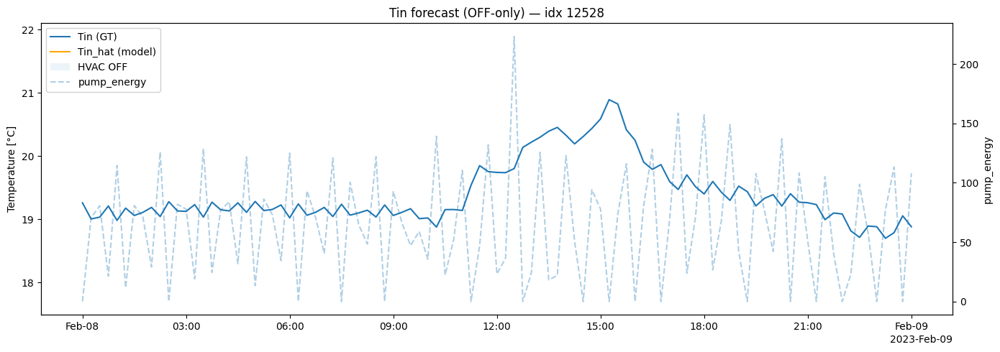

In [4]:
run_tcn_tin_for_folder(
    "datasets/retrofit/resampled",
    "hvac_mode",
    "models"
)

C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models/disaggregated\df_0\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_0\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.411°C | val RMSE_off=0.245°C | masked steps (train)=9543
Epoch 002 | train RMSE_off=0.468°C | val RMSE_off=0.280°C | masked steps (train)=9543
Epoch 003 | train RMSE_off=0.441°C | val RMSE_off=0.588°C | masked steps (train)=9543
Epoch 004 | train RMSE_off=0.447°C | val RMSE_off=0.304°C | masked steps (train)=9543
✅ Saved best model to: models/disaggregated\df_0\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_0\scaler_tin.pkl
Epoch 005 | train RMSE_off=0.424°C | val RMSE_off=0.149°C | masked steps (train)=9543
✅ Saved best model to: models/disaggregated\df_0\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_0\scaler_tin.pkl
Epoch 006 | train RMSE_off=0.384°C | val RMSE_off=0.124°C | masked steps (train)=9543
Epoch 007 | train RMSE_off=0.383°C | val RMSE_off=0.125°C | masked steps (train)=9543
✅ Sav

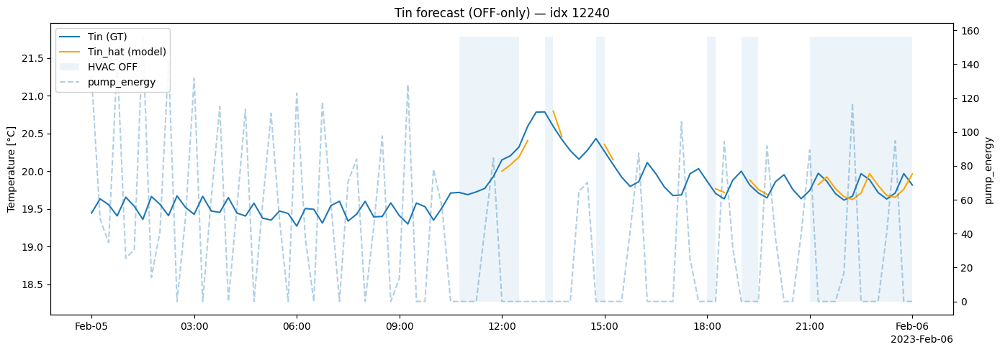

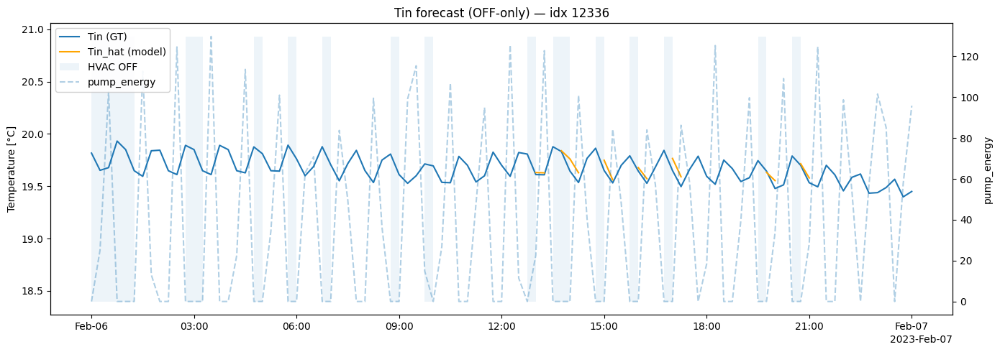

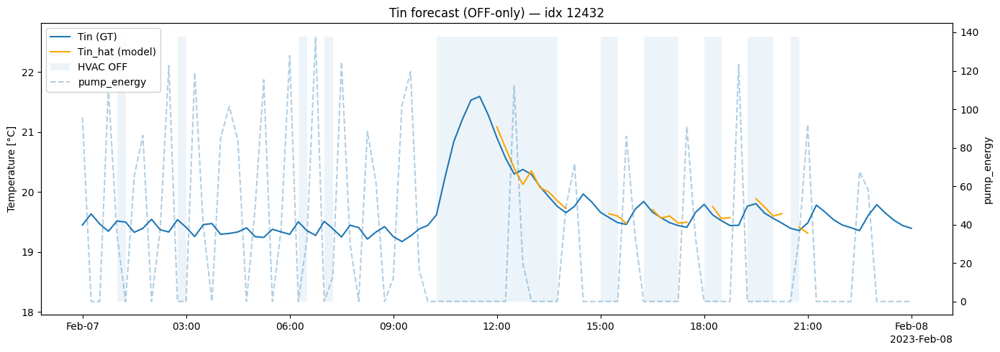

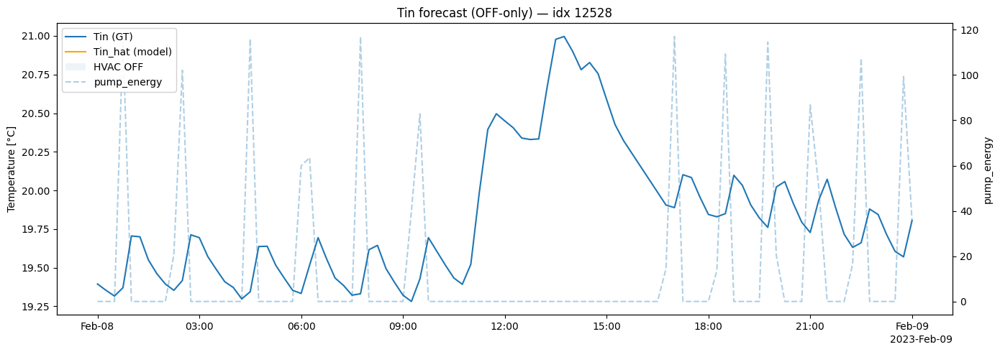

C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models/disaggregated\df_1\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_1\scaler_tin.pkl
Epoch 001 | train RMSE_off=3.015°C | val RMSE_off=0.509°C | masked steps (train)=6322
✅ Saved best model to: models/disaggregated\df_1\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_1\scaler_tin.pkl
Epoch 002 | train RMSE_off=0.522°C | val RMSE_off=0.489°C | masked steps (train)=6322
✅ Saved best model to: models/disaggregated\df_1\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_1\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.492°C | val RMSE_off=0.474°C | masked steps (train)=6322
✅ Saved best model to: models/disaggregated\df_1\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_1\scaler_tin.pkl
Epoch 004 | train RMSE_off=0.476°C | val RMSE_off=0.341°C | masked steps (train)=6322
Epoch 005 | train RMSE_off=0.458°C | val RMSE_off=0.525°C | masked steps (train)=6322
Epoch 006 | train RMSE_off=0.444°C | val RMSE_

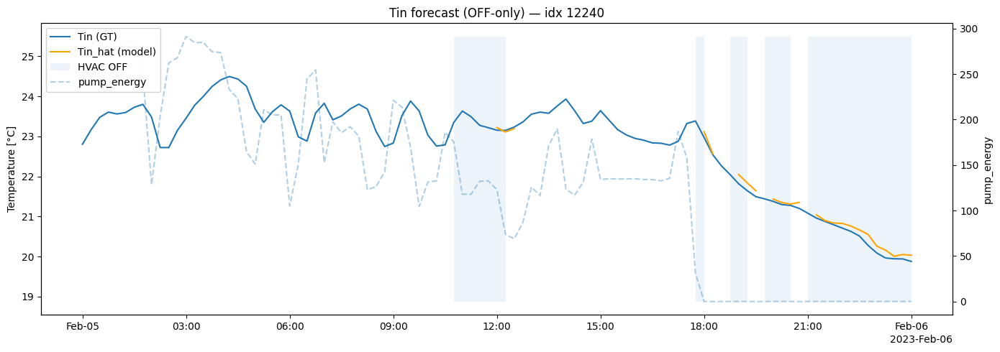

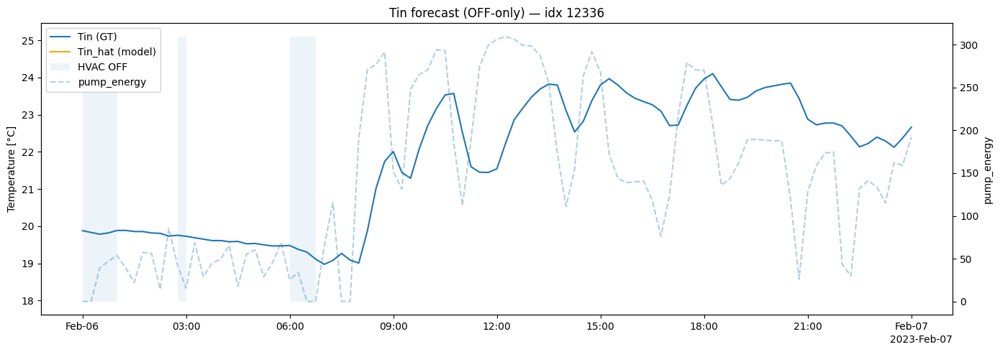

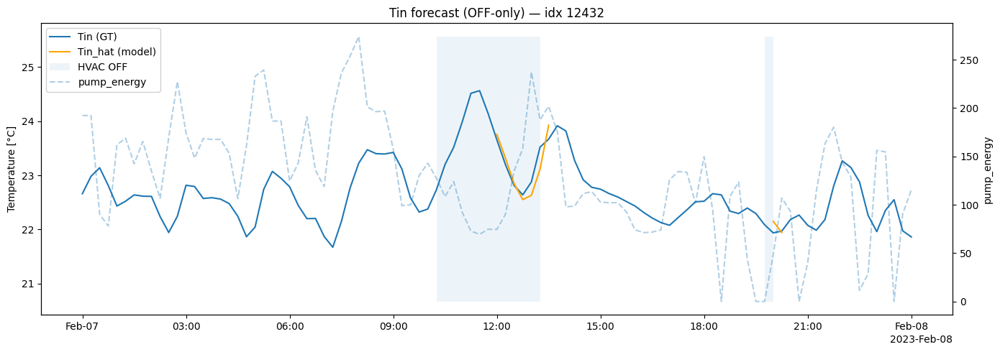

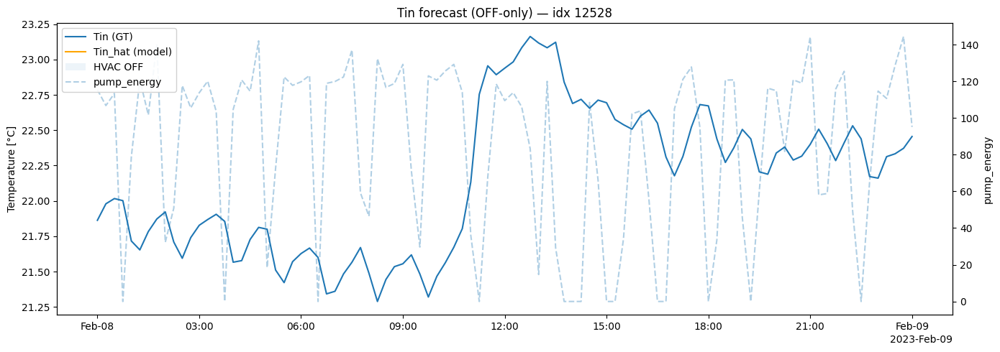

C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models/disaggregated\df_2\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_2\scaler_tin.pkl
Epoch 001 | train RMSE_off=3.201°C | val RMSE_off=0.248°C | masked steps (train)=8249
Epoch 002 | train RMSE_off=0.506°C | val RMSE_off=0.534°C | masked steps (train)=8249
Epoch 003 | train RMSE_off=0.477°C | val RMSE_off=0.360°C | masked steps (train)=8249
✅ Saved best model to: models/disaggregated\df_2\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_2\scaler_tin.pkl
Epoch 004 | train RMSE_off=0.447°C | val RMSE_off=0.192°C | masked steps (train)=8249
✅ Saved best model to: models/disaggregated\df_2\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_2\scaler_tin.pkl
Epoch 005 | train RMSE_off=0.436°C | val RMSE_off=0.172°C | masked steps (train)=8249
Epoch 006 | train RMSE_off=0.368°C | val RMSE_off=0.179°C | masked steps (train)=8249
Epoch 007 | train RMSE_off=0.370°C | val RMSE_off=0.213°C | masked steps (train)=8249
✅ Sav

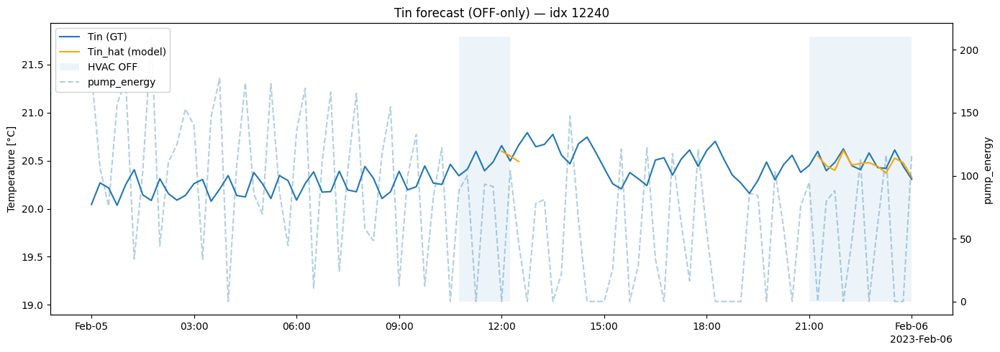

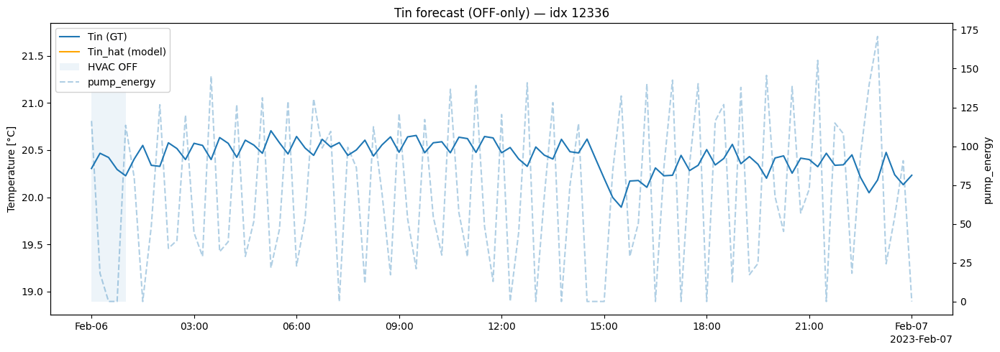

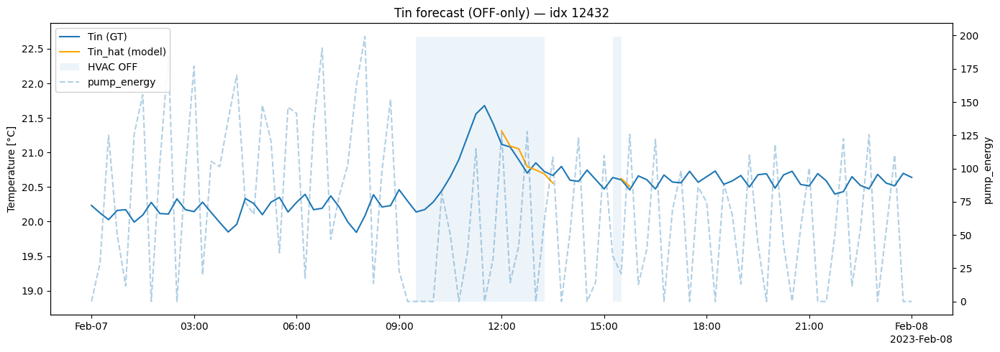

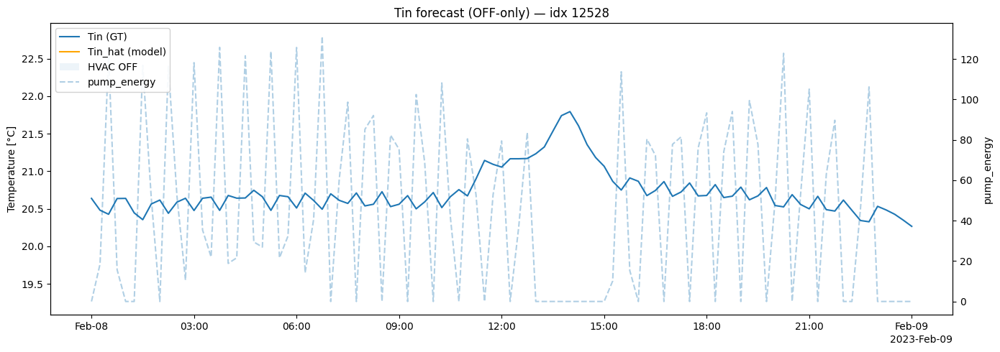

C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models/disaggregated\df_3\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_3\scaler_tin.pkl
Epoch 001 | train RMSE_off=3.444°C | val RMSE_off=0.334°C | masked steps (train)=7996
Epoch 002 | train RMSE_off=0.541°C | val RMSE_off=0.359°C | masked steps (train)=7996
✅ Saved best model to: models/disaggregated\df_3\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_3\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.512°C | val RMSE_off=0.151°C | masked steps (train)=7996
Epoch 004 | train RMSE_off=0.467°C | val RMSE_off=0.227°C | masked steps (train)=7996
Epoch 005 | train RMSE_off=0.496°C | val RMSE_off=0.181°C | masked steps (train)=7996
Epoch 006 | train RMSE_off=0.446°C | val RMSE_off=0.189°C | masked steps (train)=7996
Epoch 007 | train RMSE_off=0.461°C | val RMSE_off=0.183°C | masked steps (train)=7996
Epoch 008 | train RMSE_off=0.420°C | val RMSE_off=0.226°C | masked steps (train)=7996
Epoch 009 | train RMSE_off=0.468°C | val RMSE_off=

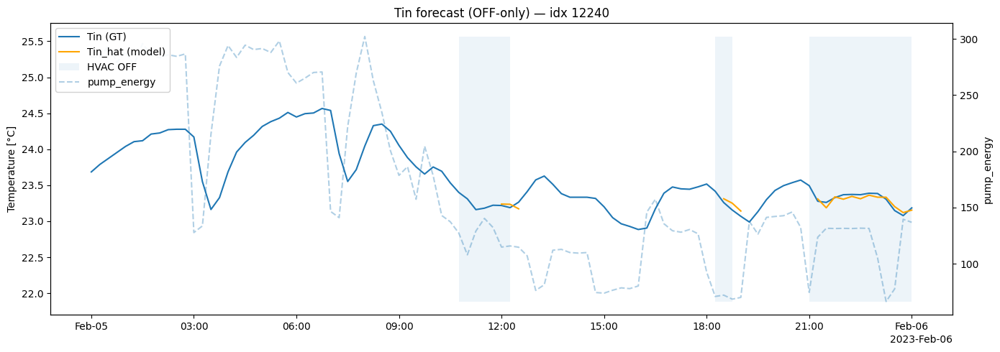

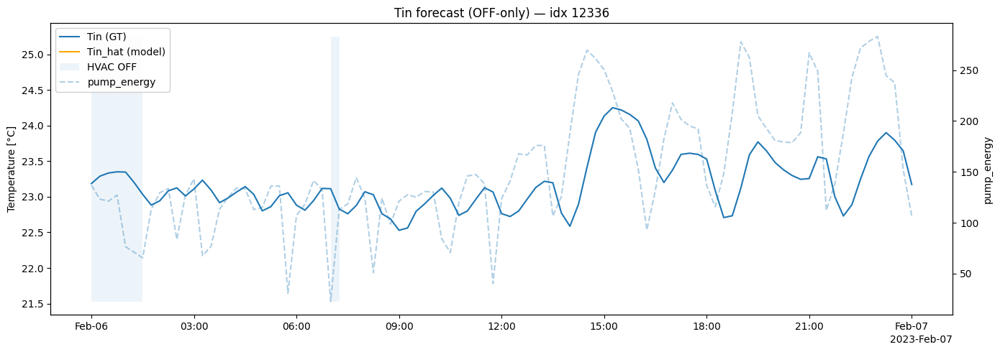

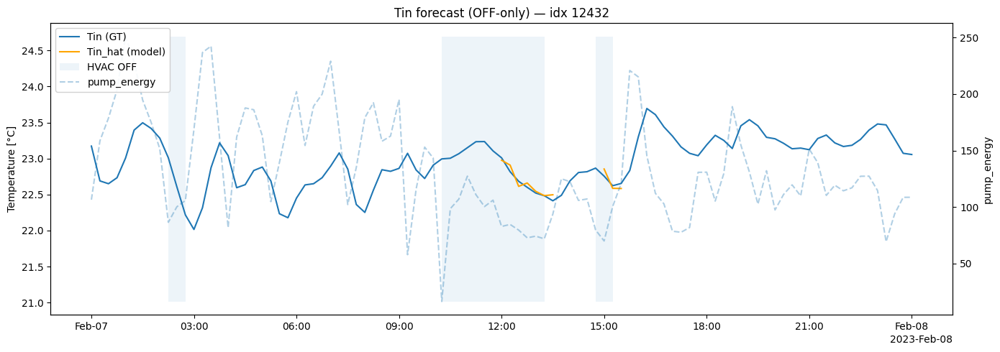

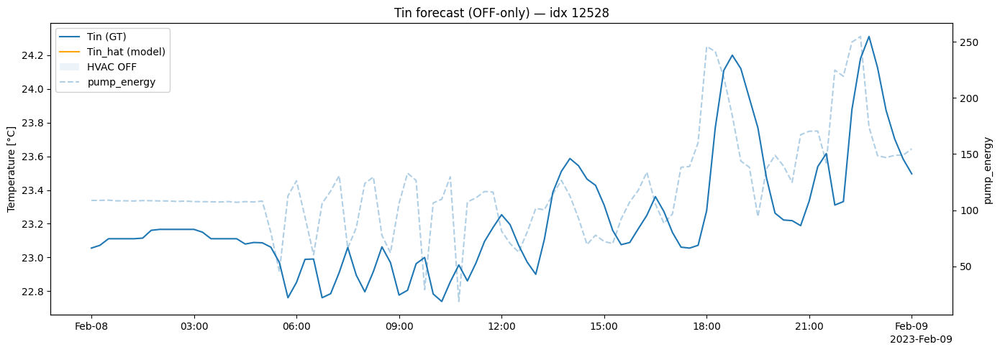

C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models/disaggregated\df_4\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_4\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.817°C | val RMSE_off=0.255°C | masked steps (train)=8399
✅ Saved best model to: models/disaggregated\df_4\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_4\scaler_tin.pkl
Epoch 002 | train RMSE_off=0.460°C | val RMSE_off=0.178°C | masked steps (train)=8399
Epoch 003 | train RMSE_off=0.464°C | val RMSE_off=0.305°C | masked steps (train)=8399
Epoch 004 | train RMSE_off=0.466°C | val RMSE_off=0.555°C | masked steps (train)=8399
Epoch 005 | train RMSE_off=0.470°C | val RMSE_off=0.202°C | masked steps (train)=8399
Epoch 006 | train RMSE_off=0.389°C | val RMSE_off=0.239°C | masked steps (train)=8399
Epoch 007 | train RMSE_off=0.377°C | val RMSE_off=0.244°C | masked steps (train)=8399
Epoch 008 | train RMSE_off=0.375°C | val RMSE_off=0.406°C | masked steps (train)=8399
Epoch 009 | train RMSE_off=0.375°C | val RMSE_off=

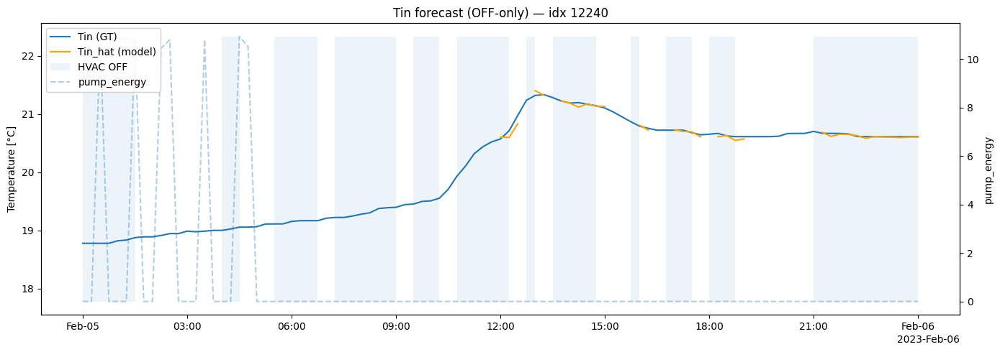

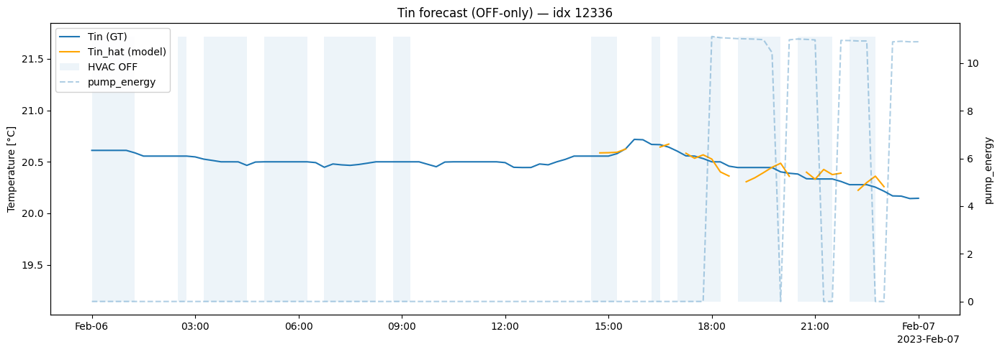

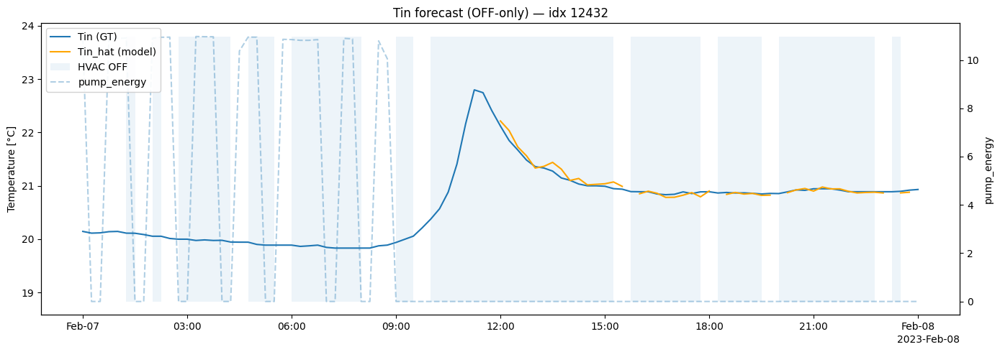

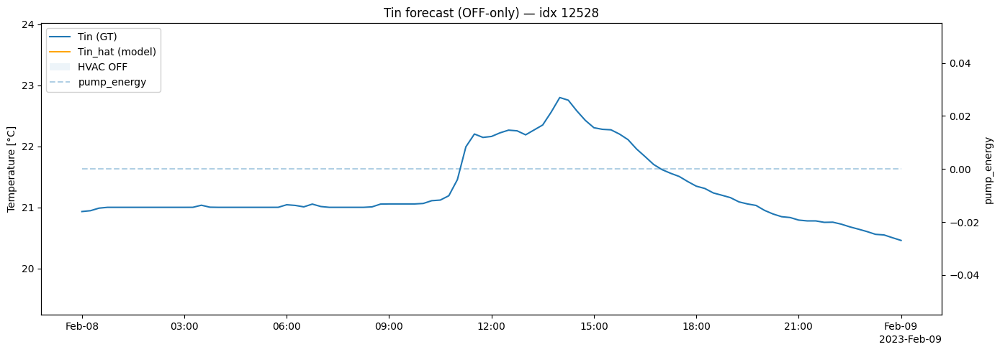

C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models/disaggregated\df_5\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_5\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.704°C | val RMSE_off=0.464°C | masked steps (train)=9131
✅ Saved best model to: models/disaggregated\df_5\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_5\scaler_tin.pkl
Epoch 002 | train RMSE_off=0.521°C | val RMSE_off=0.418°C | masked steps (train)=9131
✅ Saved best model to: models/disaggregated\df_5\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_5\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.492°C | val RMSE_off=0.141°C | masked steps (train)=9131
Epoch 004 | train RMSE_off=0.480°C | val RMSE_off=0.272°C | masked steps (train)=9131
Epoch 005 | train RMSE_off=0.472°C | val RMSE_off=0.299°C | masked steps (train)=9131
Epoch 006 | train RMSE_off=0.454°C | val RMSE_off=0.292°C | masked steps (train)=9131
✅ Saved best model to: models/disaggregated\df_5\best_tinv2.pt
🧪 Saved scaler to: models/di

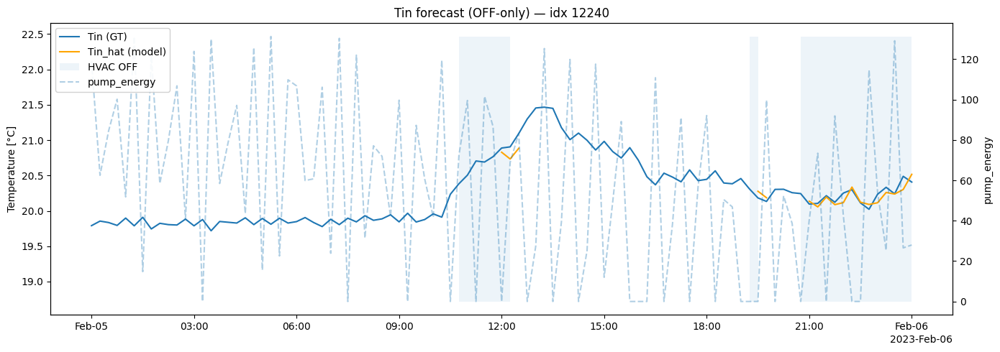

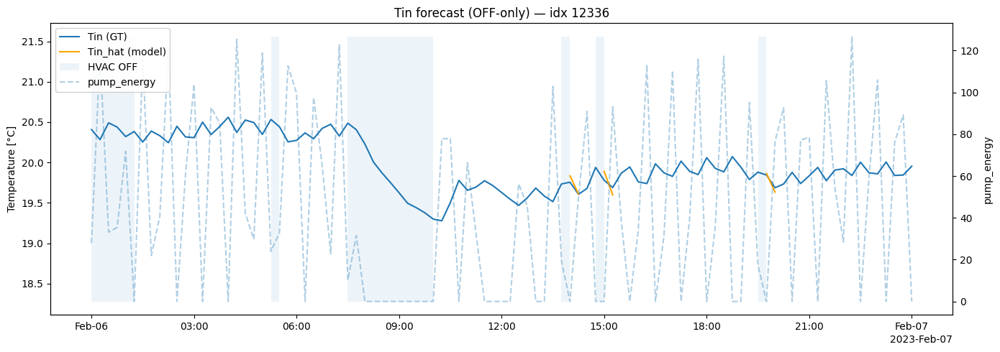

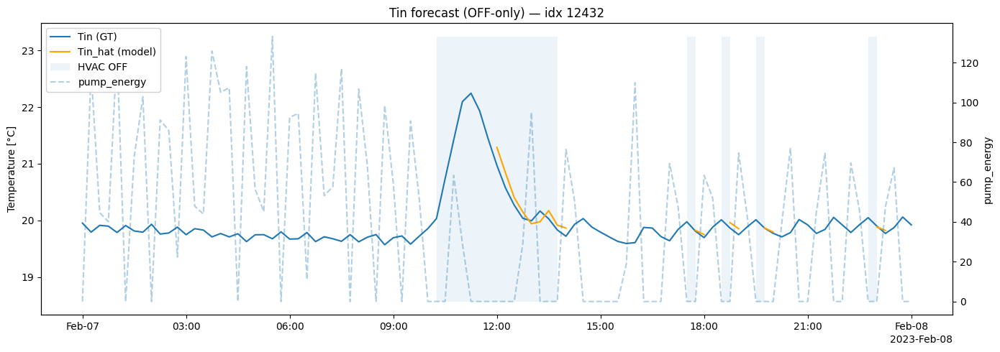

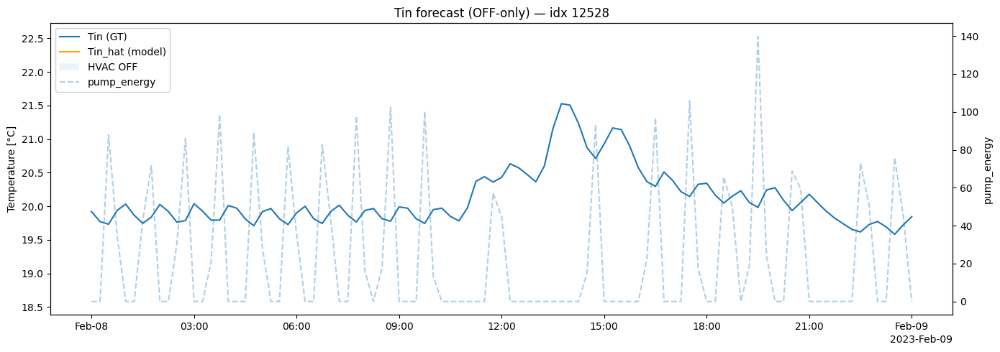

C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models/disaggregated\df_6\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_6\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.845°C | val RMSE_off=0.776°C | masked steps (train)=7221
✅ Saved best model to: models/disaggregated\df_6\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_6\scaler_tin.pkl
Epoch 002 | train RMSE_off=0.493°C | val RMSE_off=0.206°C | masked steps (train)=7221
✅ Saved best model to: models/disaggregated\df_6\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_6\scaler_tin.pkl
Epoch 003 | train RMSE_off=0.399°C | val RMSE_off=0.165°C | masked steps (train)=7221
Epoch 004 | train RMSE_off=0.407°C | val RMSE_off=0.215°C | masked steps (train)=7221
Epoch 005 | train RMSE_off=0.443°C | val RMSE_off=0.179°C | masked steps (train)=7221
Epoch 006 | train RMSE_off=0.411°C | val RMSE_off=0.211°C | masked steps (train)=7221
Epoch 007 | train RMSE_off=0.404°C | val RMSE_off=0.312°C | masked steps (train)=7221
Epoch

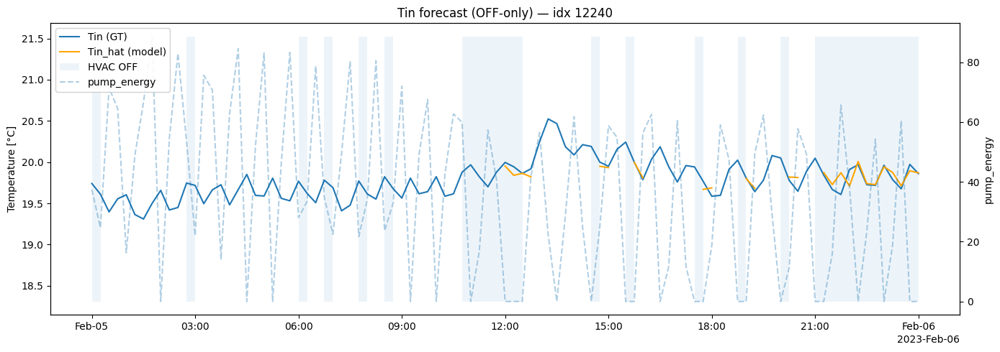

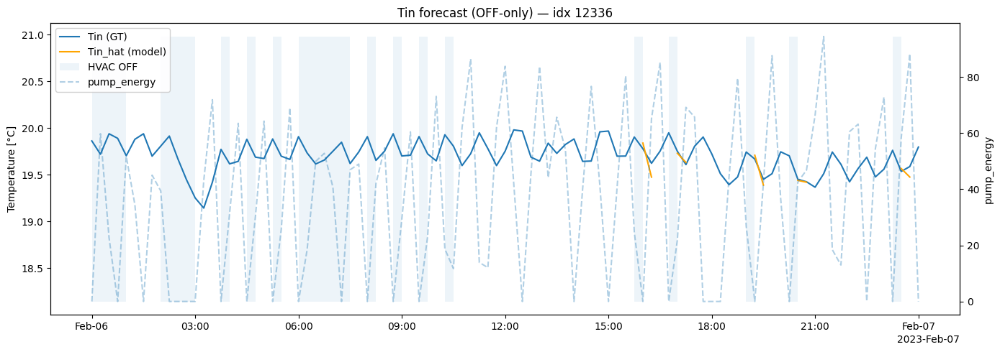

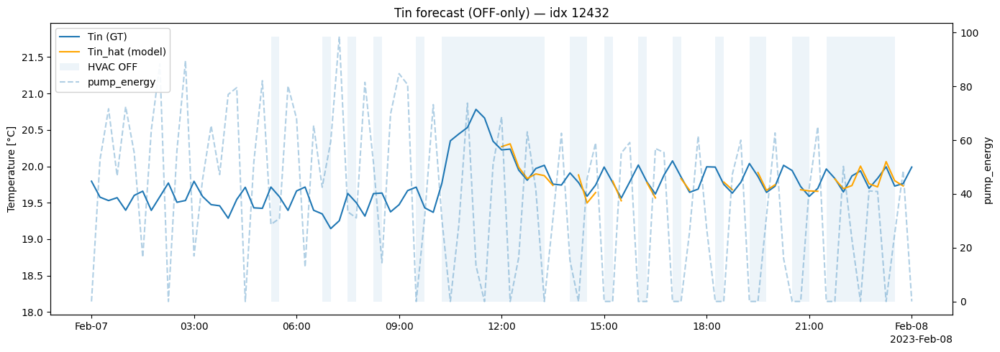

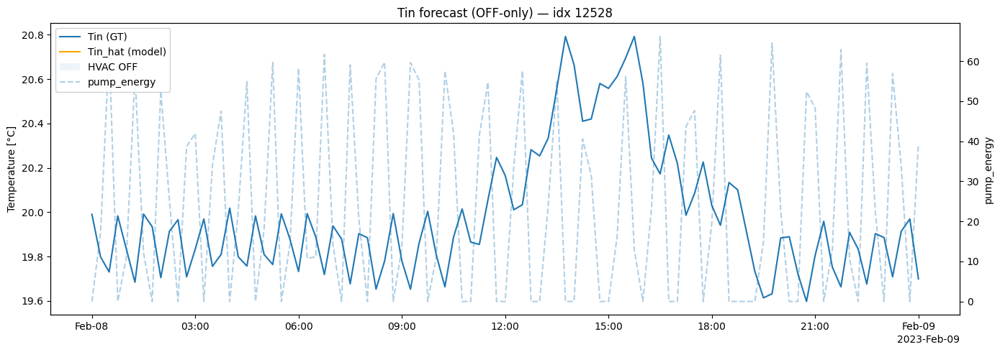

C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
C:\Users\Kelsier\AppData\Local\Temp\ipykernel_1532\1241469429.py:143: RuntimeWarning: invalid value encountered in cast
  hvac  = sub[hvac_col].values.astype(int)
c:\Users\Kelsier\.conda\envs\thesis\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


✅ Saved best model to: models/disaggregated\df_7\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_7\scaler_tin.pkl
Epoch 001 | train RMSE_off=2.801°C | val RMSE_off=0.367°C | masked steps (train)=7697
Epoch 002 | train RMSE_off=0.493°C | val RMSE_off=0.387°C | masked steps (train)=7697
Epoch 003 | train RMSE_off=0.539°C | val RMSE_off=0.398°C | masked steps (train)=7697
✅ Saved best model to: models/disaggregated\df_7\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_7\scaler_tin.pkl
Epoch 004 | train RMSE_off=0.467°C | val RMSE_off=0.252°C | masked steps (train)=7697
✅ Saved best model to: models/disaggregated\df_7\best_tinv2.pt
🧪 Saved scaler to: models/disaggregated\scalers\df_7\scaler_tin.pkl
Epoch 005 | train RMSE_off=0.450°C | val RMSE_off=0.174°C | masked steps (train)=7697
Epoch 006 | train RMSE_off=0.412°C | val RMSE_off=0.452°C | masked steps (train)=7697
Epoch 007 | train RMSE_off=0.401°C | val RMSE_off=0.240°C | masked steps (train)=7697
Epoch

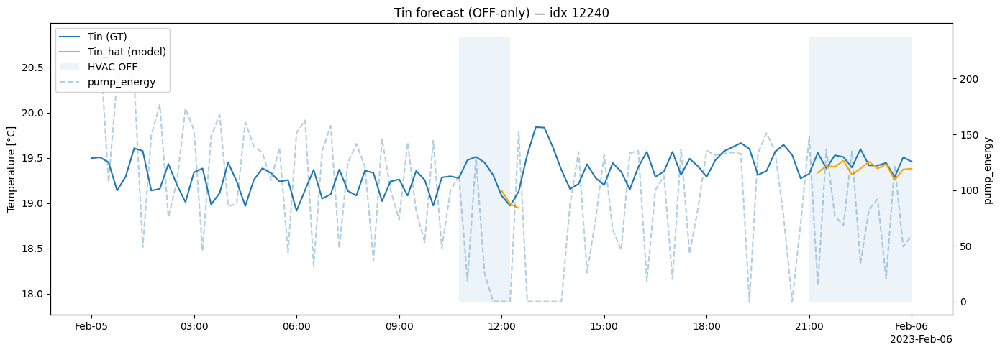

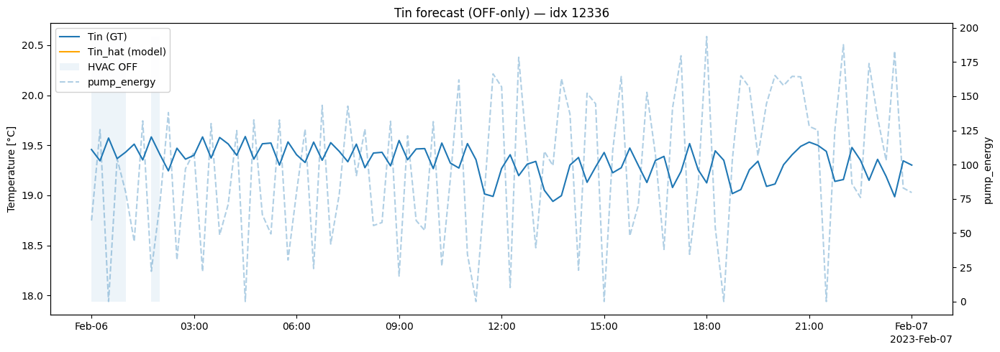

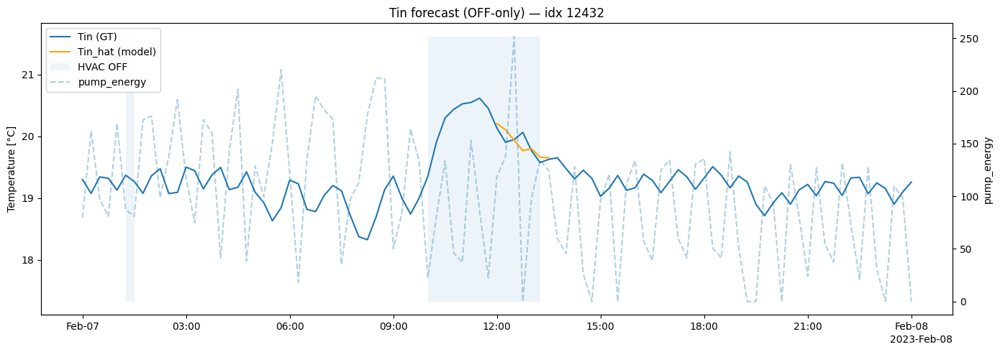

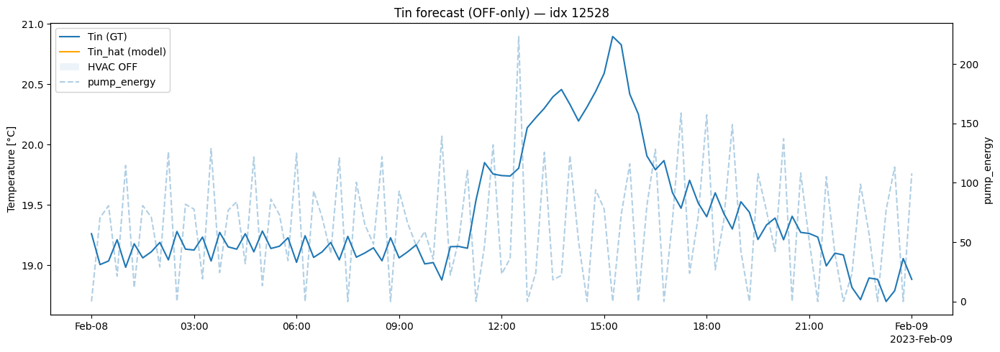

In [5]:
run_tcn_tin_for_folder(
    "datasets/retrofit/resampled/disaggregated",
    "hvac_mode",
    "models/disaggregated"
)